# 2024년 여름 - 한양대학교 AI 부트캠프

### 2024년 8월 12일 (월) 10:00-17:00 (실습 15:30-17:00)

Instructor : 인공지능학과 석박과정 강찬익 (chanik@hanynag.ac.kr)

----

### 0. Meep (Python) 설치 - Colab ver.


설치 소요시간: Colab CPU 기준 약 3분 이내

In [ ]:
!pip uninstall -y condacolab
!rm -rf /root/condacolab

# conda 설치
!pip install -q condacolab
import condacolab
condacolab.install()

# conda를 통한 meep 설치
# !which conda
!conda install -c conda-forge pymeep

!conda create -n pmp -c conda-forge pymeep=*=mpi_mpich_*
!conda activate pmp

!pip install nlopt

⏬ Downloading https://github.com/conda-forge/miniforge/releases/download/23.11.0-0/Mambaforge-23.11.0-0-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:16
🔁 Restarting kernel...
Channels:
 - conda-forge
Platform: linux-64
Solving environment: | / - \ | done


==> WARNING: A newer version of conda exists. <==
    current version: 23.11.0
    latest version: 24.7.1

Please update conda by running

    $ conda update -n base -c conda-forge conda



## Package Plan ##

  environment location: /usr/local

  added / updated specs:
    - pymeep


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    brotli-1.1.0               |       hd590300_1          19 KB  conda-forge
    brotli-bin-1.1.0           |       hd590300_1          19 KB  conda-forge
    ca-certificates-2024.7.4   |       hbcca054_0         151 KB  conda-forge
    cache

<details>
<summary><b>참고: 로컬 설치 명령어</b></summary>

### 1. Conda 설치
하단 링크에서 OS에 맞는 Conda 설치

[Conda 설치 링크](https://repo.anaconda.com/archive/)

### 2. Conda 명령어로 Python Meep 설치
```bash
conda create -n pmp conda-forge pymeep=*=mpi_mpich_*
```

### 3\. Conda meep 환경 activate
```bash
conda activate pmp
```

### MPI 실행 예시
```bash
mpirun -np 64 python code.py
```

</details>

#### 설치 확인


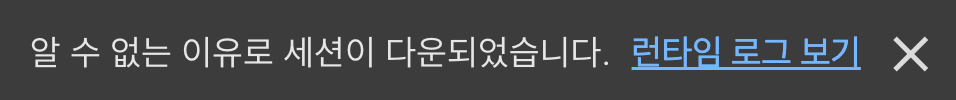

위 경고가 뜨더라도, 정상 설치 되니 아래 코드를 통해서 설치 유무 확인하면 됩니다.

In [ ]:
try:
    import meep as mp

    print("정상 설치 되었습니다!")
except Exception as e:
    print(e)
    print("설치 오류")

정상 설치 되었습니다!


----

### 1. FDTD simulation Meep 기초

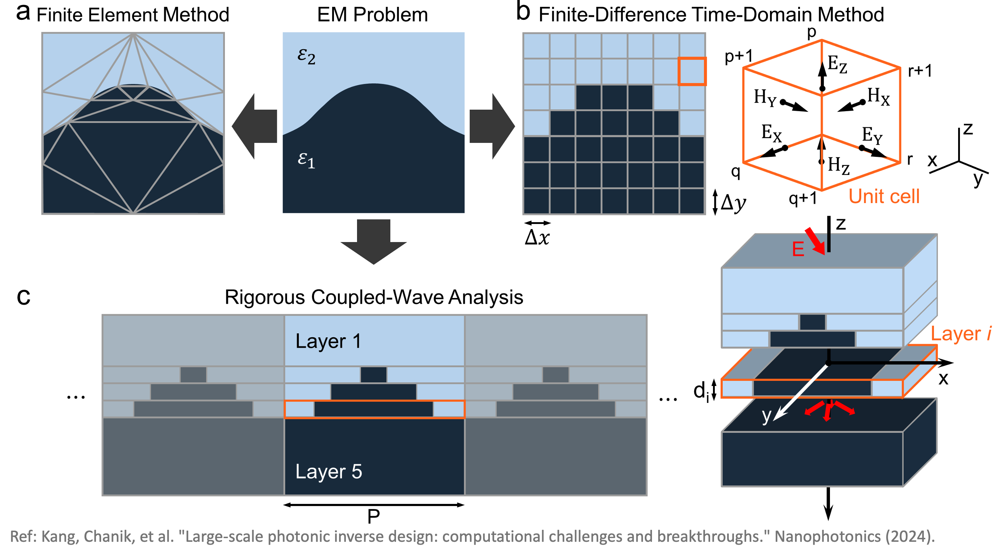

PyMEEP에서 숫자의 기본 단위는 micrometer(um)입니다. 이 점 유의하시어 코드를 작성하시면 됩니다.

PyMEEP에서 사용되는 모든 함수 및 클래스 등의 자세 설명은 공식 PyMEEP Documentation 페이지를 참고하시면 찾아보실 수 있습니다.

링크: [PyMEEP 공식 Documentation](https://meep.readthedocs.io/en/latest/)

**PyMEEP에서 전자기 시뮬레이션은 `mp.Simulation` 클래스를 통해 이루어집니다.** 구체적으로는,
1. 시뮬레이션 환경과 속성을 이 클래스를 구성하는 attribute를 설정하여 클래스를 최종적으로 완성하여,
2. `run()`을 실행함으로써 이루어집니다.

`mp.Simulation`과 `run()`는 각각 다음과 같이 정의되며, 상황마다 필요한 attribute를 설정하시어 클래스를 완성하시면 됩니다.

``` python
class Simulation(object):
    def __init__(self,
                cell_size: Union[meep.geom.Vector3, Tuple[float, ...]] = None,
                resolution: float = None,
                geometry: Optional[List[meep.geom.GeometricObject]] = None,
                sources: Optional[List[meep.source.Source]] = None,
                eps_averaging: bool = True,
                dimensions: int = 3,
                boundary_layers: Optional[List[meep.simulation.PML]] = None,
                symmetries: Optional[List[meep.simulation.Symmetry]] = None,
                force_complex_fields: bool = False,
                default_material: meep.geom.Medium = Medium(),
                m: float = 0,
                k_point: Union[meep.geom.Vector3, Tuple[float, ...], bool] = False,
                kz_2d: str = 'complex',
                extra_materials: Optional[List[meep.geom.Medium]] = None,
                material_function: Optional[Callable[[Union[meep.geom.Vector3, Tuple[float, ...]]], meep.geom.Medium]] = None,
                epsilon_func: Optional[Callable[[Union[meep.geom.Vector3, Tuple[float, ...]]], float]] = None,
                epsilon_input_file: str = '',
                progress_interval: float = 4,
                subpixel_tol: float = 0.0001,
                subpixel_maxeval: int = 100000,
                loop_tile_base_db: int = 0,
                loop_tile_base_eh: int = 0,
                ensure_periodicity: bool = True,
                num_chunks: int = 0,
                Courant: float = 0.5,
                accurate_fields_near_cylorigin: bool = False,
                filename_prefix: Optional[str] = None,
                output_volume: Optional[meep.simulation.Volume] = None,
                output_single_precision: bool = False,
                geometry_center: Union[meep.geom.Vector3, Tuple[float, ...]] = Vector3<0.0, 0.0, 0.0>,
                force_all_components: bool = False,
                split_chunks_evenly: bool = True,
                chunk_layout=None,
                collect_stats: bool = False):
```

```python
# 실행함수 run
def run(self, *step_funcs, **kwargs):
def run(step_functions..., until=condition/time):
def run(step_functions..., until_after_sources=condition/time):
```


#### 1-a. 시뮬레이션 공간 구현

1. `cell_size` - 시뮬레이션 공간의 크기
2. `resolution` - 격자 해상도 (Grid point의 개수)
3. `geometry` - 물질 영역 (물체와 공간의 모양, 크기, 위치 등)
4. `sources` - 광원 특성 (광원의 개수, 위치, 파장 등)
5. `boundary_layers` - 경계 조건

In [ ]:
import meep as mp
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
'''
--------------------------------------------------------------------------------------------------------
                                1. 시뮬레이션 영역 설정

시뮬레이션 영역을 설정하는 부분입니다.
cell은 시뮬레이션 영역의 크기를, resolution은 한 격자가 몇 개의 grid point로 이루어지는지를 설정하는 변수입니다.
--------------------------------------------------------------------------------------------------------
'''

cell = mp.Vector3(4, 0, 2) # x축으로 4um, y축으로 0um, z축으로 2um의 크기를 가지는 시뮬레이션 영역을 설정합니다.
resolution = 10 # 한 격자가 몇 개의 grid point로 이루어지는지를 설정합니다. 10으로 설정하면 한 칸에 10 개의 grid point가 생성됩니다.


'''
--------------------------------------------------------------------------------------------------------
                                2. 물질 영역 설정

물질 영역을 설정하는 부분입니다.
geometry는 물체의 모양과 위치, 그리고 물질의 종류를 설정하는 변수입니다.
--------------------------------------------------------------------------------------------------------
'''
# mp.Material()을 이용하여 미리 정의된 물질 설정값을 불러올 수도 있지만, 직접 설정할 수도 있습니다.
# [예시]
# from meep.materials import SiO2
# from meep.materials import Si

# 이번 예제에서는 직접 설정해보겠습니다.

Air = mp.Medium(index = 1) # Air의 굴절률을 1로 설정합니다.
SiO2 = mp.Medium(index = 1.46) # SiO2의 굴절률을 1.46로 설정합니다.
Si = mp.Medium(index = 3.68) # Si의 굴절률을 3.68로 설정합니다.

'''
---------------------------------------------------------------------------------------
                                3. 광원 설정

광원을 설정하는 부분입니다. sources는 광원의 종류와 위치, 크기, 그리고 광원의 주파수를 설정하는 변수입니다.
---------------------------------------------------------------------------------------
'''
# EigenModeSource를 이용하여 광원을 설정할 수 있습니다. EigenModeSource는 특정한 주파수에서의 고유모드를 설정할 수 있습니다.

fcen = 1 / 0.55
fwidth = 0.1

sources = [
    mp.EigenModeSource(
        src=mp.GaussianSource(frequency=fcen, fwidth=fwidth),
        center=mp.Vector3(-1.2, 0, 0),
        size=mp.Vector3(0, 0, 2),
        direction=mp.X,  # This ensures emission in the +x direction
        eig_match_freq=True  # Ensure that the source frequency matches the eigenmode
    )
]


'''
---------------------------------------------------------------------------------------
                                4. 경계 조건 설정

경계 조건을 설정하는 부분입니다. pml_layers는 Perfectly Matched Layer를 설정하는 변수입니다. Perfectly Matched Layer는 시뮬레이션 영역의 경계에서 전자기파가 반사되는 것을 방지하는 역할을 합니다.
---------------------------------------------------------------------------------------
'''

pml_layers = [mp.PML(thickness=0.5, direction = mp.X)]


'''
---------------------------------------------------------------------------------------
                                5. 시뮬레이션 설정

이상 상황에서 설정한 변수들을 이용하여 시뮬레이션 클래스를 설정하는 부분입니다.
---------------------------------------------------------------------------------------
'''

sim = mp.Simulation(
    cell_size = cell,
    sources = sources,
    boundary_layers = pml_layers,
    resolution = resolution
)


<Axes: xlabel='X', ylabel='Z'>

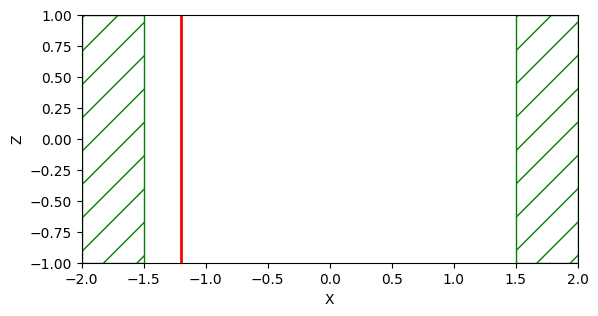

In [ ]:
# 시뮬레이션 영역 시각화
sim.plot2D()

In [ ]:
'''
---------------------------------------------------------------------------------------
                                6. 시뮬레이션 실행

전체 설정이 완료되었으면, 이제 시뮬레이션을 실행할 차례입니다. run() 메서드를 이용하여 시뮬레이션을 실행할 수 있습니다.
---------------------------------------------------------------------------------------
'''
# until 뒤에 숫자를 설정함으로써 시뮬레이션을 몇 time unit동안 실행할 지 설정합니다. 한 time unit은 실제 시간으로는 0.1초입니다.
# 하지만 PyMEEP에서는 길이 단위가 um이므로, 실제로 한 time unit이 의미하는 시간은 빛이 1 um을 통과하는 시간, 즉 약 3.3 fs입니다.
sim.run(until=50)

-----------
Initializing structure...
time for choose_chunkdivision = 0.00012207 s
Working in 3D dimensions.
Computational cell is 4 x 0.1 x 2 with resolution 10
time for set_epsilon = 0.00633502 s
-----------
MPB solved for frequency_1(1.81818,0,0) = 1.81818 after 21 iters


FloatProgress(value=0.0, description='0% done ', max=50.0)

run 0 finished at t = 50.0 (1000 timesteps)


<Axes: xlabel='X', ylabel='Z'>

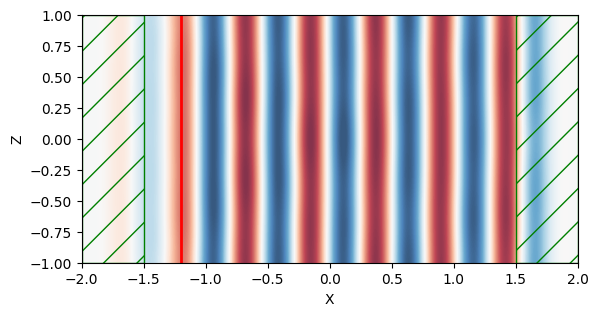

In [ ]:
# 시뮬레이션 영역 시각화
sim.plot2D(fields = mp.Ez)

In [ ]:
from IPython.display import Video
import os
# 1. 디렉토리 존재 확인 및 생성
output_dir = "video"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# 2. ffmpeg 설치 확인 (리눅스 기준)
if os.system("ffmpeg -version") != 0:
    raise EnvironmentError("ffmpeg가 설치되어 있지 않습니다. 설치해 주세요.")

sim.reset_meep()
f = plt.figure(dpi=100)
Animate = mp.Animate2D(fields=mp.Ez, f=f, realtime=False, normalize=True)

sim.run(mp.at_every(1, Animate), until=100)
plt.close()


filename = "video/straight_waveguide.mp4"
Animate.to_mp4(10, filename)

Video(filename)

-----------
Initializing structure...
time for choose_chunkdivision = 6.19888e-05 s
Working in 3D dimensions.
Computational cell is 4 x 0.1 x 2 with resolution 10
time for set_epsilon = 0.00609088 s
-----------
MPB solved for frequency_1(1.81818,0,0) = 1.81818 after 21 iters


FloatProgress(value=0.0, description='0% done ')

Normalizing field data...
run 1 finished at t = 100.0 (2000 timesteps)
Generating MP4...


In [ ]:
# 시뮬레이션 초기화
sim.reset_meep()

#### 1-b. 물질 배치

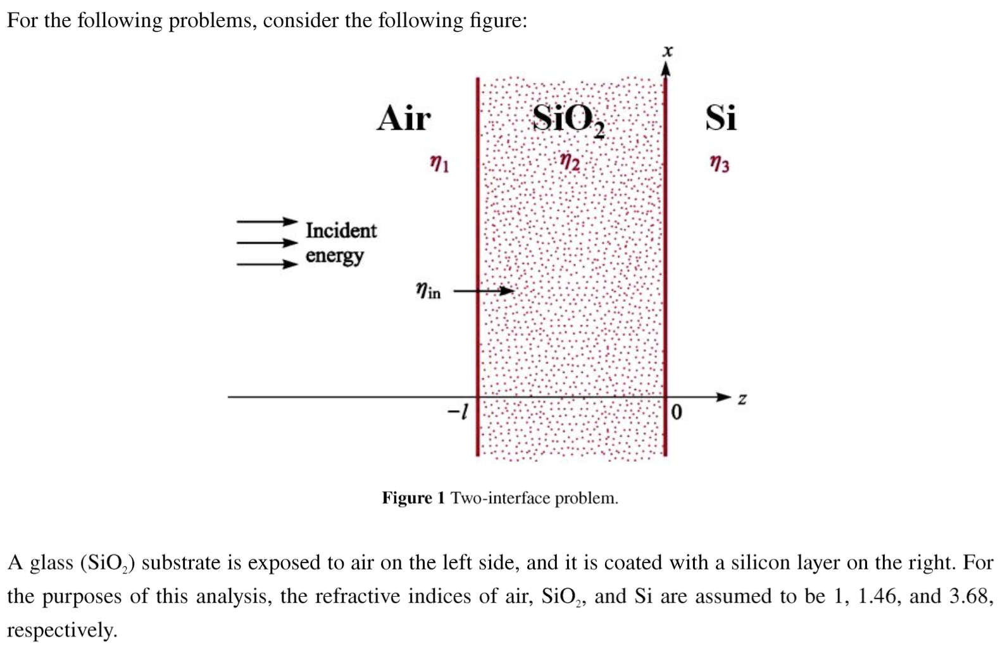

Upon normal incidence of light with a wavelength of 700 nm from the left side, plot the steady-state electric field and magnetic field for $z, t$ when the glass thickness ($l$) is:

$0.25 \times 700\ \mathrm{nm}$


1. 시뮬레이션 영역
2. 물질, 물질 영역
3. 광원 설정
4. 경계 조건 설정
5. 시뮬레이션 설정
6. 시뮬레이션 실행

In [ ]:
'''
--------------------------------------------------------------------------------------------------------
                                1. 시뮬레이션 영역 설정

시뮬레이션 영역을 설정하는 부분입니다.
cell은 시뮬레이션 영역의 크기를, resolution은 한 격자가 몇 개의 grid point로 이루어지는지를 설정하는 변수입니다.
--------------------------------------------------------------------------------------------------------
'''

cell = mp.Vector3(4, 0, 2) # x축으로 4um, y축으로 0um, z축으로 2um의 크기를 가지는 시뮬레이션 영역을 설정합니다.
resolution = 50 # 한 격자가 몇 개의 grid point로 이루어지는지를 설정합니다. 100으로 설정하면 한 칸에 100 개의 grid point가 생성됩니다.


'''
--------------------------------------------------------------------------------------------------------
                                2. 물질 영역 설정

물질 영역을 설정하는 부분입니다.
geometry는 물체의 모양과 위치, 그리고 물질의 종류를 설정하는 변수입니다.
--------------------------------------------------------------------------------------------------------
'''
# mp.Material()을 이용하여 미리 정의된 물질 설정값을 불러올 수도 있지만, 직접 설정할 수도 있습니다.
# [예시]
# from meep.materials import SiO2
# from meep.materials import Si

# 이번 예제에서는 직접 설정해보겠습니다.

Air = mp.Medium(index = 1) # Air의 굴절률을 1로 설정합니다.
SiO2 = mp.Medium(index = 1.46) # SiO2의 굴절률을 1.46로 설정합니다.
Si = mp.Medium(index = 3.68) # Si의 굴절률을 3.68로 설정합니다.

layer2_length = 0.25 * 0.7

# 문제 상황에서의 물질 영역을 설정합니다. mp.Block()을 이용하여 물체를 블록 형태로 설정할 수 있습니다.
# 물체를 겹치면 이어진 물체로 인식됩니다. 이 예제에서 각 layer는 맞닿아 있는 구조이므로, 정확히 맞닿아 있도록 설정해야 합니다.
geometry = [mp.Block(mp.Vector3(2-layer2_length, mp.inf, mp.inf),
                     center = mp.Vector3(-layer2_length - 0.5*(2-layer2_length), 0, 0),
                     material = mp.Medium(epsilon = 1)),
            mp.Block(mp.Vector3(layer2_length, mp.inf, mp.inf),
                     center = mp.Vector3(-0.5*layer2_length, 0, 0),
                     material = SiO2),
            mp.Block(mp.Vector3(2, mp.inf, mp.inf),
                     center = mp.Vector3(1, 0, 0),
                     material = Si)]

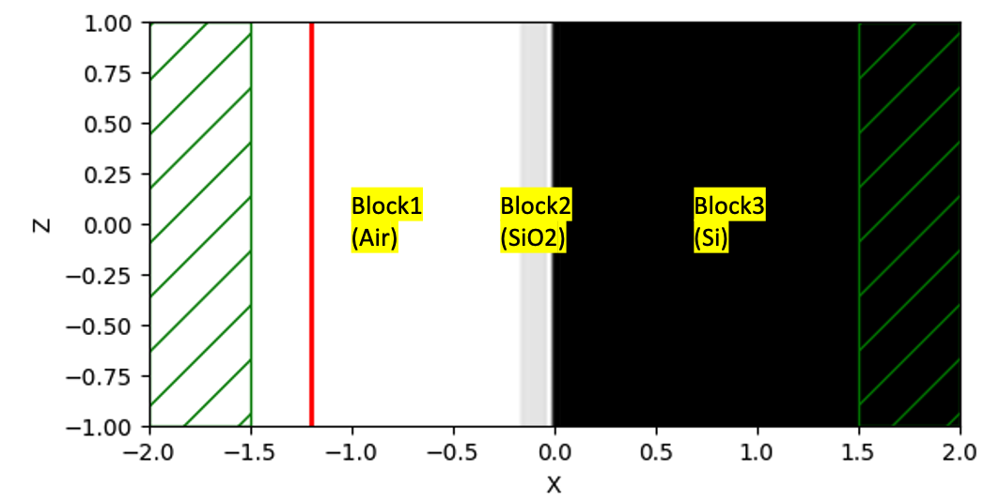

In [ ]:
'''
---------------------------------------------------------------------------------------
                                3. 광원 설정

광원을 설정하는 부분입니다. sources는 광원의 종류와 위치, 크기, 그리고 광원의 주파수를 설정하는 변수입니다.
---------------------------------------------------------------------------------------
'''
# EigenModeSource를 이용하여 광원을 설정할 수 있습니다. EigenModeSource는 특정한 주파수에서의 고유모드를 설정할 수 있습니다.

fcen = 1 / 0.7
fwidth = 0.2

sources = [
    mp.EigenModeSource(
        src=mp.GaussianSource(frequency=fcen, fwidth=fwidth),
        center=mp.Vector3(-1.2, 0, 0),
        size=mp.Vector3(0, 0, 2),
        direction=mp.X,  # This ensures emission in the +x direction
        eig_match_freq=True  # Ensure that the source frequency matches the eigenmode
    )
]


'''
---------------------------------------------------------------------------------------
                                4. 경계 조건 설정

경계 조건을 설정하는 부분입니다. pml_layers는 Perfectly Matched Layer를 설정하는 변수입니다. Perfectly Matched Layer는 시뮬레이션 영역의 경계에서 전자기파가 반사되는 것을 방지하는 역할을 합니다.
---------------------------------------------------------------------------------------
'''

pml_layers = [mp.PML(thickness=0.5, direction = mp.X)]


'''
---------------------------------------------------------------------------------------
                                5. 시뮬레이션 설정

이상 상황에서 설정한 변수들을 이용하여 시뮬레이션 클래스를 설정하는 부분입니다.
---------------------------------------------------------------------------------------
'''

sim = mp.Simulation(
    cell_size = cell,
    geometry = geometry,
    sources = sources,
    boundary_layers = pml_layers,
    resolution = resolution)


     block, center = (-1.0875,0,0)
          size (1.825,1e+20,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     block, center = (-0.0875,0,0)
          size (0.175,1e+20,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (2.1316,2.1316,2.1316)
     block, center = (1,0,0)
          size (2,1e+20,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (13.5424,13.5424,13.5424)


<Axes: xlabel='X', ylabel='Z'>

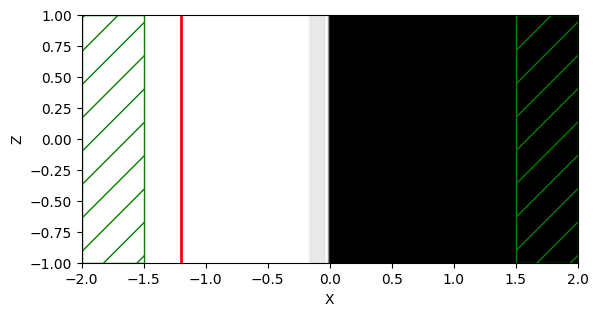

In [ ]:
# 시각화
sim.plot2D()

In [ ]:
'''
---------------------------------------------------------------------------------------
                                6. 시뮬레이션 실행

전체 설정이 완료되었으면, 이제 시뮬레이션을 실행할 차례입니다. run() 메서드를 이용하여 시뮬레이션을 실행할 수 있습니다.
---------------------------------------------------------------------------------------
'''
# until 뒤에 숫자를 설정함으로써 시뮬레이션을 몇 time unit동안 실행할 지 설정합니다. 한 time unit은 실제 시간으로는 0.1초입니다.
# 하지만 PyMEEP에서는 길이 단위가 um이므로, 실제로 한 time unit이 의미하는 시간은 빛이 1 um을 통과하는 시간, 즉 약 3.3 fs입니다.
sim.run(until=30)

-----------
Initializing structure...
time for choose_chunkdivision = 0.000123978 s
Working in 3D dimensions.
Computational cell is 4 x 0.02 x 2 with resolution 50
     block, center = (-1.0875,0,0)
          size (1.825,1e+20,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     block, center = (-0.0875,0,0)
          size (0.175,1e+20,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (2.1316,2.1316,2.1316)
     block, center = (1,0,0)
          size (2,1e+20,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (13.5424,13.5424,13.5424)
time for set_epsilon = 0.22931 s
-----------
MPB solved for frequency_1(1.42857,0,0) = 1.42857 after 18 iters


FloatProgress(value=0.0, description='0% done ', max=30.0)

run 0 finished at t = 30.0 (3000 timesteps)


     block, center = (-1.0875,0,0)
          size (1.825,1e+20,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     block, center = (-0.0875,0,0)
          size (0.175,1e+20,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (2.1316,2.1316,2.1316)
     block, center = (1,0,0)
          size (2,1e+20,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (13.5424,13.5424,13.5424)


<Axes: xlabel='X', ylabel='Z'>

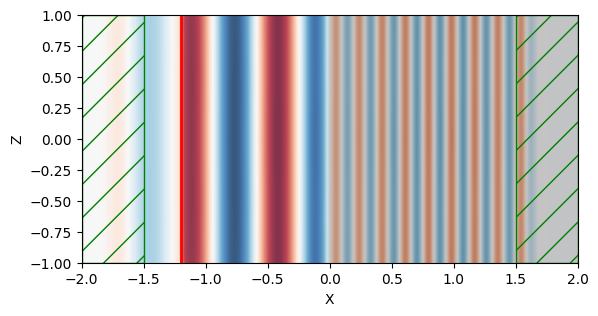

In [ ]:
# 시뮬레이션 영역 시각화
sim.plot2D(fields = mp.Ez)

In [ ]:
sim.reset_meep()

### Chapter 1. 요약

### Ch 2. Adjoint simulation (inverse design)

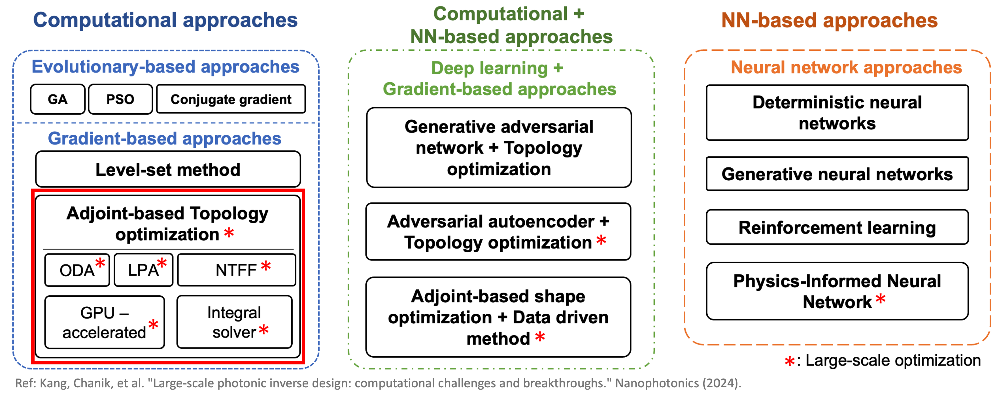

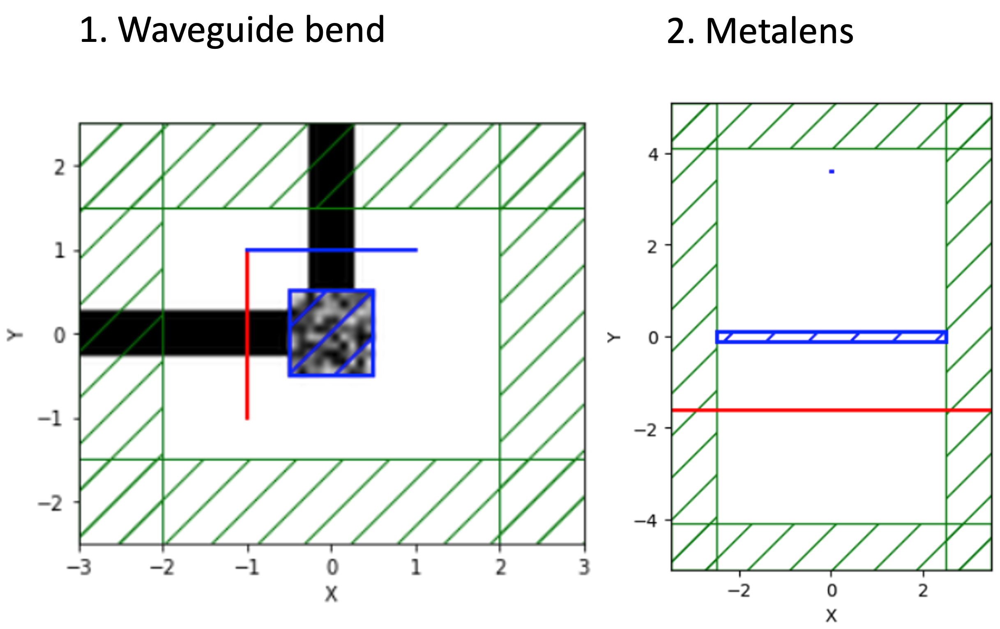

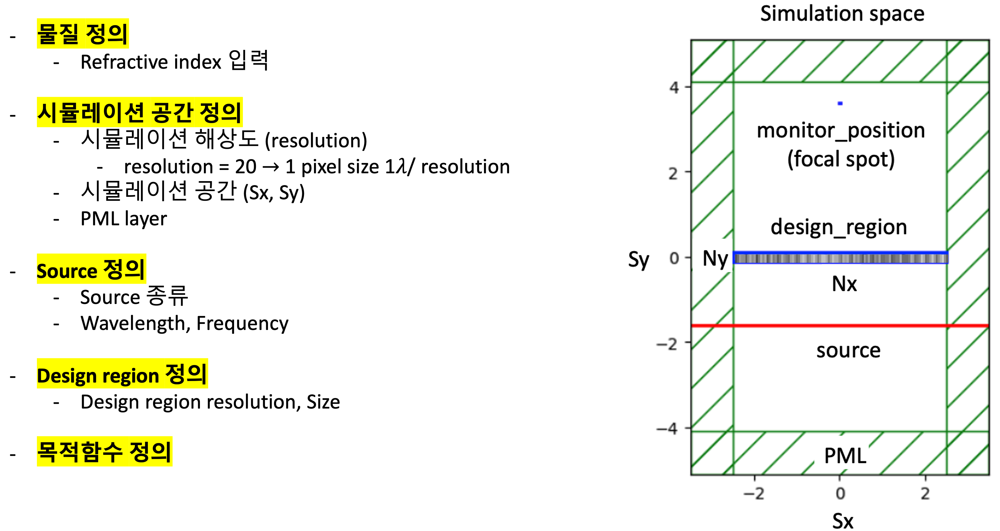

#### 2-a. Waveguide bend 설계

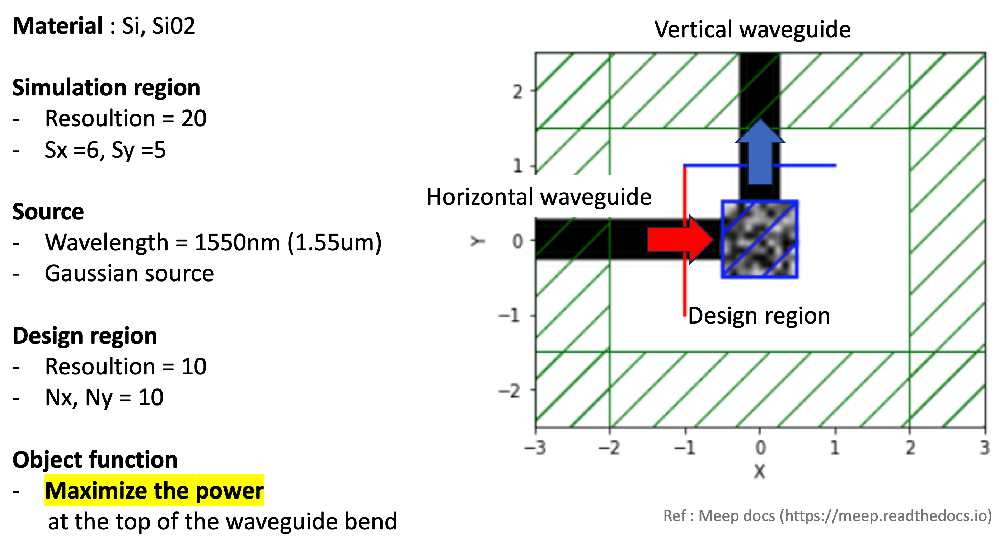

In [ ]:
import meep as mp
import meep.adjoint as mpa
import numpy as np
from autograd import numpy as npa
import nlopt
from matplotlib import pyplot as plt

In [ ]:
'''
--------------------------------------------------------------------------------------------------------
                                1. 시뮬레이션 영역 설정
--------------------------------------------------------------------------------------------------------
'''

resolution = 20

Sx = 6
Sy = 5
cell_size = mp.Vector3(Sx, Sy)

pml_layers = [mp.PML(1.0)]

'''
--------------------------------------------------------------------------------------------------------
                                2. 물질 설정
--------------------------------------------------------------------------------------------------------
'''
Si = mp.Medium(index=3.4)
SiO2 = mp.Medium(index=1.44)


'''
--------------------------------------------------------------------------------------------------------
                                3. 광원 설정
--------------------------------------------------------------------------------------------------------
'''
fcen = 1 / 1.55
width = 0.2
fwidth = width * fcen
source_center = [-1.5, 0, 0]
source_size = mp.Vector3(0, 2, 0)
kpoint = mp.Vector3(1, 0, 0)
src = mp.GaussianSource(frequency=fcen, fwidth=fwidth)
source = [
    mp.EigenModeSource(
        src,
        eig_band=1,
        direction=mp.NO_DIRECTION,
        eig_kpoint=kpoint,
        size=source_size,
        center=source_center,
    )
]

'''
--------------------------------------------------------------------------------------------------------
                                4. 설계 영역 설정
--------------------------------------------------------------------------------------------------------
'''

design_region_resolution = 10
Nx = design_region_resolution + 1
Ny = design_region_resolution + 1

design_variables = mp.MaterialGrid(mp.Vector3(Nx, Ny), SiO2, Si, grid_type="U_MEAN")
design_region = mpa.DesignRegion(
    design_variables, volume=mp.Volume(center=mp.Vector3(), size=mp.Vector3(1, 1, 0))
)


geometry = [
    mp.Block(
        center=mp.Vector3(x=-Sx / 4), material=Si, size=mp.Vector3(Sx / 2, 0.5, 0)
    ),  # horizontal waveguide
    mp.Block(
        center=mp.Vector3(y=Sy / 4), material=Si, size=mp.Vector3(0.5, Sy / 2, 0)
    ),  # vertical waveguide
    mp.Block(
        center=design_region.center, size=design_region.size, material=design_variables
    ),  # design region
    ]

sim = mp.Simulation(
    cell_size=cell_size,
    boundary_layers=pml_layers,
    geometry=geometry,
    sources=source,
    eps_averaging=False,
    resolution=resolution,
)

'''
--------------------------------------------------------------------------------------------------------
                                5. 목적함수 설정
--------------------------------------------------------------------------------------------------------
'''
TE_top = mpa.EigenmodeCoefficient(
    sim, mp.Volume(center=mp.Vector3(0, 1, 0), size=mp.Vector3(x=2)), mode=1
)
ob_list = [TE_top]


def J(alpha):
    return npa.abs(alpha) ** 2


In [ ]:
'''
--------------------------------------------------------------------------------------------------------
                                6. 최적화
--------------------------------------------------------------------------------------------------------
'''
opt = mpa.OptimizationProblem(
    simulation=sim,
    objective_functions=J,
    objective_arguments=ob_list,
    design_regions=[design_region],
    fcen=fcen,
    df=0,
    nf=1,
)

     block, center = (-1.5,0,0)
          size (3,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,1.25,0)
          size (0.5,2.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,0,0)
          size (1,1,0)
          axes (1,0,0), (0,1,0), (0,0,1)


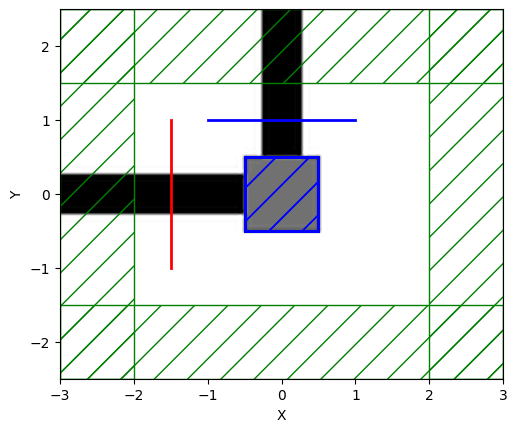

In [ ]:
## 설계 영역 초기 유전률 설정 ##
x0 = 0.5 * np.ones((Nx * Ny,))
opt.update_design([x0])

opt.plot2D(True)
plt.show()

In [ ]:
evaluation_history = []
sensitivity = [0]


def f(x, grad):
    f0, dJ_du = opt([x])
    f0 = f0[0]  # f0 is an array of length 1
    if grad.size > 0:
        grad[:] = np.squeeze(dJ_du)
    evaluation_history.append(np.real(f0))
    sensitivity[0] = dJ_du
    return np.real(f0)

In [ ]:
algorithm = nlopt.LD_MMA
n = Nx * Ny
maxeval = 20

solver = nlopt.opt(algorithm, n)
solver.set_lower_bounds(0)
solver.set_upper_bounds(1)
solver.set_max_objective(f)
solver.set_maxeval(maxeval)

In [ ]:
x = solver.optimize(x0);

Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000299931 s
Working in 2D dimensions.
Computational cell is 6 x 5 x 0 with resolution 20
     block, center = (-1.5,0,0)
          size (3,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,1.25,0)
          size (0.5,2.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,0,0)
          size (1,1,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.037626 s
-----------
MPB solved for frequency_1(1,0,0) = 0.343302 after 23 iters
MPB solved for frequency_1(2.07325,0,0) = 0.646573 after 11 iters
MPB solved for frequency_1(2.06829,0,0) = 0.645161 after 7 iters
MPB solved for frequency_1(2.06829,0,0) = 0.645161 after 1 iters
on time step 4761 (time=119.025), 0.000840168 s/step
run 20 finished at t = 196.875 

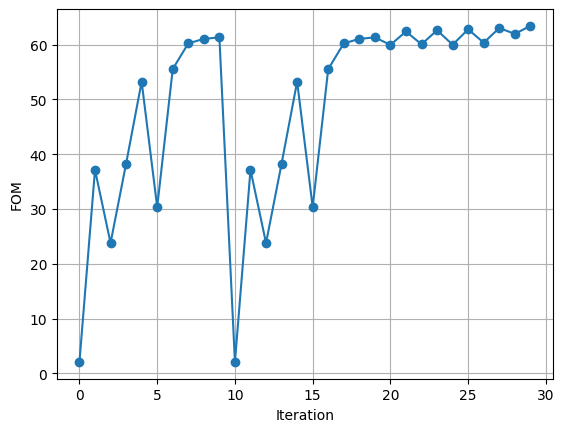

In [ ]:
plt.figure()
plt.plot(evaluation_history, "o-")
plt.grid(True)
plt.xlabel("Iteration")
plt.ylabel("FOM")
plt.show()

     block, center = (-1.5,0,0)
          size (3,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,1.25,0)
          size (0.5,2.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,0,0)
          size (1,1,0)
          axes (1,0,0), (0,1,0), (0,0,1)


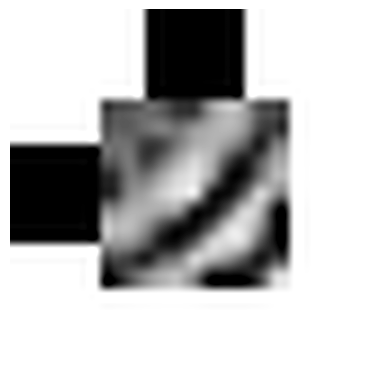

In [ ]:
opt.update_design([x])
opt.plot2D(
    True,
    plot_monitors_flag=False,
    output_plane=mp.Volume(center=(0, 0, 0), size=(2, 2, 0)),
)
plt.axis("off");

In [ ]:
opt.sim.reset_meep()

#### 2-b. Metalens 설계

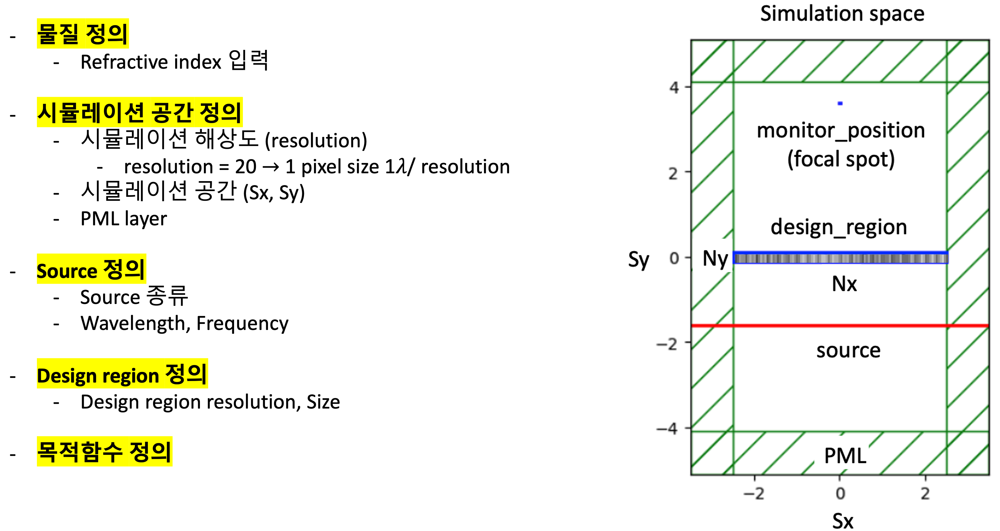

In [ ]:
import meep as mp
import meep.adjoint as mpa
import numpy as np
from autograd import numpy as npa
from autograd import tensor_jacobian_product, grad
import nlopt
from matplotlib import pyplot as plt
from matplotlib.patches import Circle

In [ ]:
Si = mp.Medium(index=3.4)
Air = mp.Medium(index=1.0)

In [ ]:
resolution = 10

design_region_width = 4
design_region_height = 2
pml_size = 1.0

Sx = 2 * pml_size + design_region_width
Sy = 2 * pml_size + design_region_height + 5
cell_size = mp.Vector3(Sx, Sy)

wavelengths = np.array([1.5, 1.55, 1.6])
frequencies = 1/wavelengths
nf = len(frequencies) # number of frequencies

minimum_length = 0.09  # minimum length scale (microns)
eta_i = 0.5  # blueprint (or intermediate) design field thresholding point (between 0 and 1)
eta_e = 0.55  # erosion design field thresholding point (between 0 and 1)
eta_d = 1 - eta_e  # dilation design field thresholding point (between 0 and 1)
filter_radius = mpa.get_conic_radius_from_eta_e(minimum_length, eta_e)
design_region_resolution = int(resolution)

pml_layers = [mp.PML(pml_size)]

fcen = 1 / 1.55
width = 0.2
fwidth = width * fcen
source_center = [0, -(design_region_height / 2 + 1.5), 0]
source_size = mp.Vector3(Sx, 0, 0)

src = mp.GaussianSource(frequency=fcen, fwidth=fwidth, is_integrated=True)
source = [mp.Source(src, component=mp.Ez, size=source_size, center=source_center)]

Nx = int(round(design_region_resolution * design_region_width)) + 1
Ny = int(round(design_region_resolution * design_region_height)) + 1

design_variables = mp.MaterialGrid(mp.Vector3(Nx, Ny), Air, Si, grid_type="U_MEAN")
design_region = mpa.DesignRegion(
    design_variables,
    volume=mp.Volume(
        center=mp.Vector3(),
        size=mp.Vector3(design_region_width, design_region_height, 0),
    ),
)


def mapping(x, eta, beta):

    # filter
    filtered_field = mpa.conic_filter(
        x,
        filter_radius,
        design_region_width,
        design_region_height,
        design_region_resolution,
    )

    # projection
    projected_field = mpa.tanh_projection(filtered_field, beta, eta)

    # interpolate to actual materials
    return projected_field.flatten()


geometry = [
    mp.Block(
        center=design_region.center, size=design_region.size, material=design_variables
    )
]

sim = mp.Simulation(
    cell_size=cell_size,
    boundary_layers=pml_layers,
    geometry=geometry,
    sources=source,
    default_material=Air,
    resolution=resolution,
)

     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


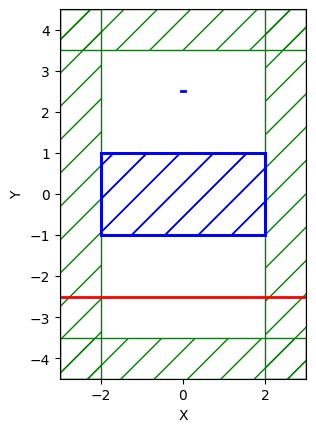

In [ ]:
monitor_position, monitor_size = mp.Vector3(0,design_region_height/2+1.5), mp.Vector3(0.1,0)
FourierFields = mpa.FourierFields(sim,mp.Volume(center=monitor_position,size=monitor_size),mp.Ez,yee_grid=True)
ob_list = [FourierFields]

def J(fields):
    return npa.mean(npa.abs(fields[:,1]) ** 2) # The index 1 corresponds to the point at the center of our monitor.

opt = mpa.OptimizationProblem(
    simulation=sim,
    objective_functions=[J],
    objective_arguments=ob_list,
    design_regions=[design_region],
    frequencies=frequencies,
    maximum_run_time=100,
)
opt.plot2D(True)

In [ ]:
evaluation_history = []
cur_iter = [0]

def f(v, gradient, beta):
    print("Current iteration: {}".format(cur_iter[0] + 1))

    f0, dJ_du = opt([mapping(v, eta_i, beta)])  # compute objective and gradient

    if gradient.size > 0:
        gradient[:] = tensor_jacobian_product(mapping, 0)(
            v, eta_i, beta, np.sum(dJ_du, axis=1)
        )  # backprop

    evaluation_history.append(np.real(f0))

    plt.figure()
    ax = plt.gca()
    opt.plot2D(
        False,
        ax=ax,
        plot_sources_flag=False,
        plot_monitors_flag=False,
        plot_boundaries_flag=False,
    )
    circ = Circle((2, 2), minimum_length / 2)
    ax.add_patch(circ)
    ax.axis("off")
    plt.show()

    cur_iter[0] = cur_iter[0] + 1

    return np.real(f0)

Current iteration: 1
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000202179 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0210018 s
-----------
run 0 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...


/usr/local/lib/python3.10/site-packages/meep/adjoint/filter_source.py:187: RuntimeWarning: invalid value encountered in divide
  l2_err = np.sum(np.abs(H - H_hat.T) ** 2 / np.abs(H) ** 2)


run 1 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


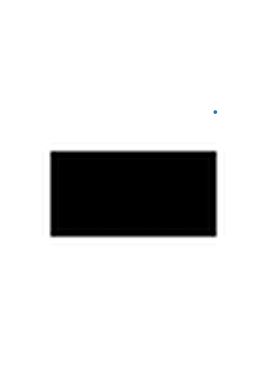

Current iteration: 2
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000193119 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0221989 s
-----------
run 2 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 3 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


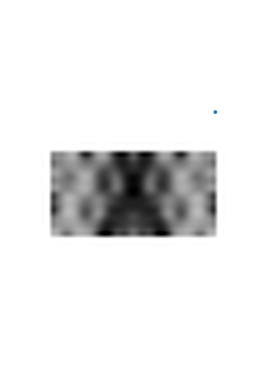

Current iteration: 3
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000188112 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0281169 s
-----------
run 4 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 5 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


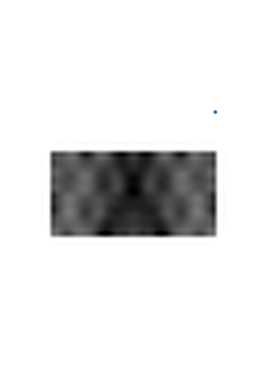

Current iteration: 4
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000207901 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0176351 s
-----------
run 6 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 7 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


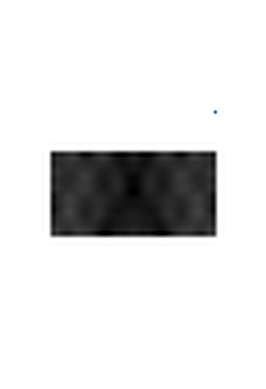

Current iteration: 5
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.00019002 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0195699 s
-----------
run 8 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 9 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


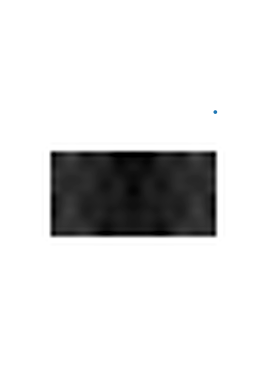

Current iteration: 6
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000200033 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0243959 s
-----------
run 10 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 11 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


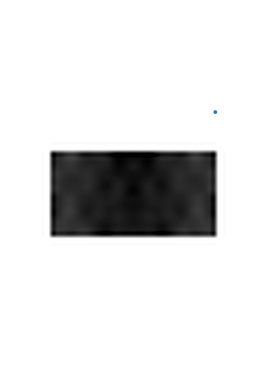

Current iteration: 7
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000194073 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.019846 s
-----------
run 12 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 13 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


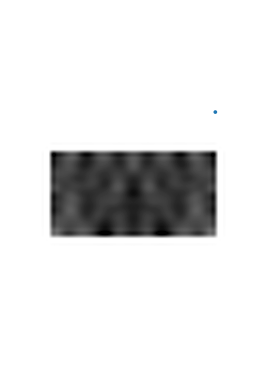

Current iteration: 8
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000189066 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0234241 s
-----------
run 14 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 15 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


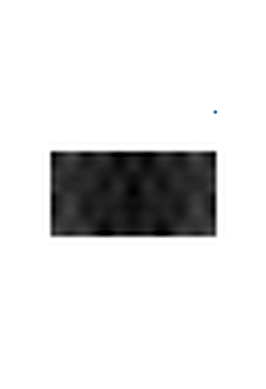

Current iteration: 9
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.00018692 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0184789 s
-----------
run 16 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 17 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


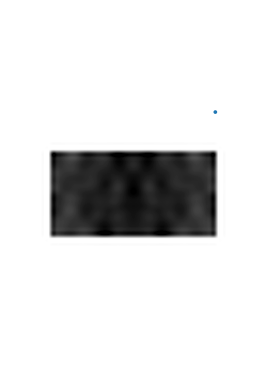

Current iteration: 10
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000171185 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0259969 s
-----------
run 18 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 19 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


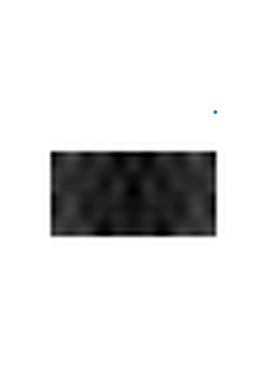

Current iteration: 11
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000203133 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0634592 s
-----------
run 20 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 21 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


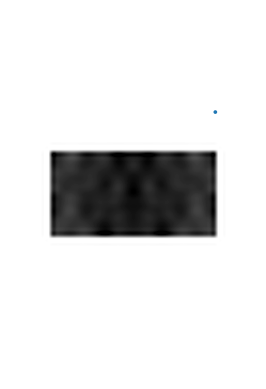

Current iteration: 12
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000173092 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.025445 s
-----------
run 22 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 23 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


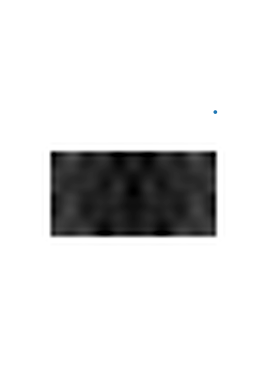

Current iteration: 13
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000194073 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.031544 s
-----------
run 24 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 25 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


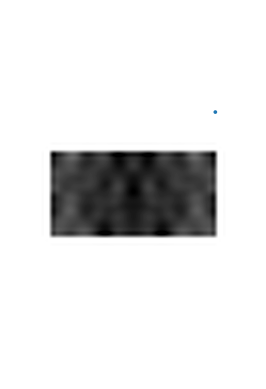

Current iteration: 14
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000209808 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0211611 s
-----------
run 26 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 27 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


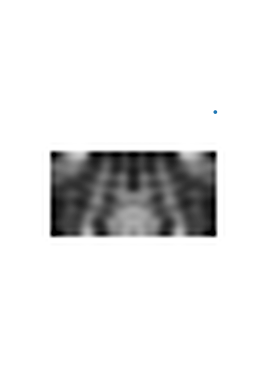

Current iteration: 15
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000192881 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0199931 s
-----------
run 28 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 29 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


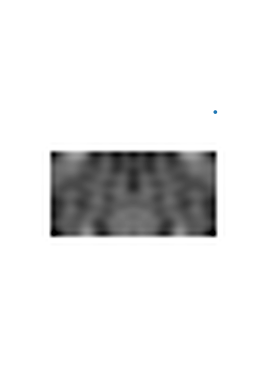

Current iteration: 16
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000188112 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0181861 s
-----------
run 30 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 31 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


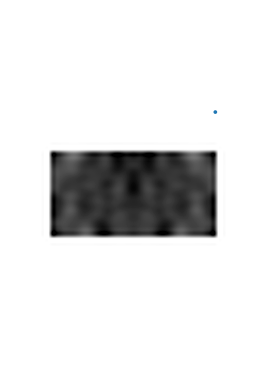

Current iteration: 17
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000183821 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.018368 s
-----------
run 32 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 33 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


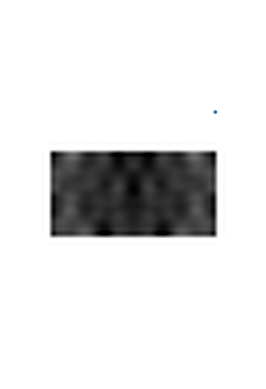

Current iteration: 18
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.00018692 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0299749 s
-----------
run 34 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 35 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


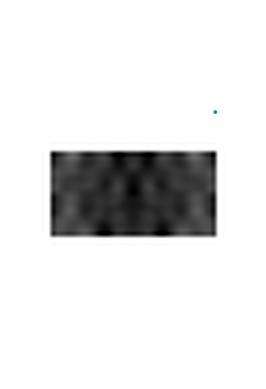

Current iteration: 19
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000183105 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0344851 s
-----------
run 36 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 37 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


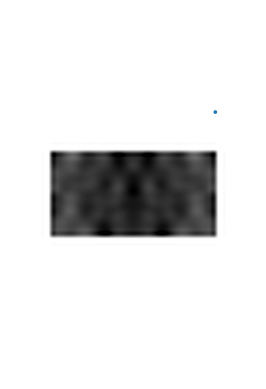

Current iteration: 20
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000189066 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0188119 s
-----------
run 38 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 39 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


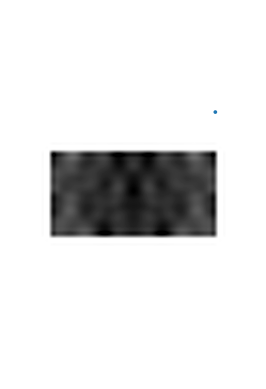

Current iteration: 21
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000184059 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.030973 s
-----------
run 40 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 41 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


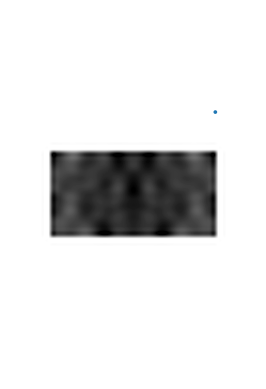

Current iteration: 22
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000188112 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0223019 s
-----------
run 42 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 43 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


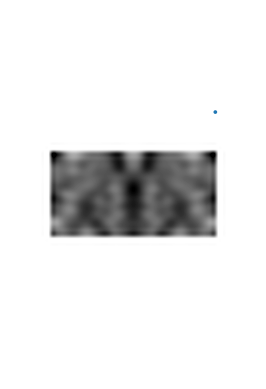

Current iteration: 23
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000185966 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0343249 s
-----------
run 44 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 45 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


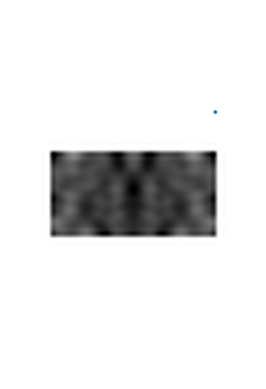

Current iteration: 24
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000212908 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.017905 s
-----------
run 46 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 47 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


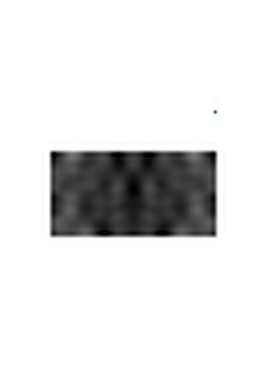

Current iteration: 25
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000202894 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0191879 s
-----------
run 48 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 49 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


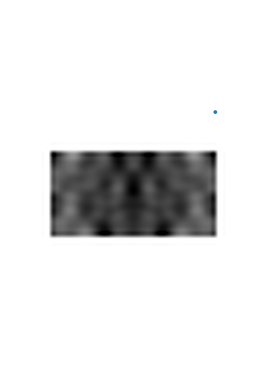

Current iteration: 26
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000202894 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0189381 s
-----------
run 50 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 51 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


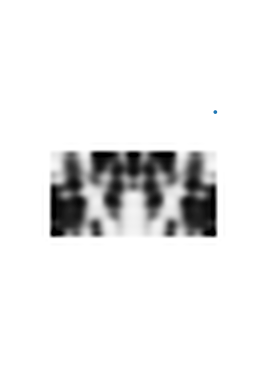

Current iteration: 27
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000187159 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0177541 s
-----------
run 52 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 53 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


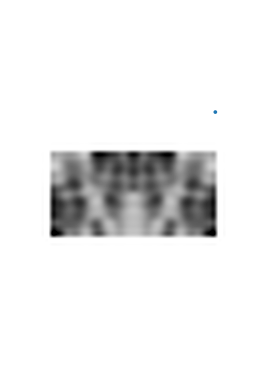

Current iteration: 28
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.00018692 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0270181 s
-----------
run 54 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 55 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


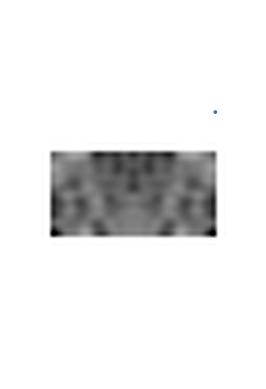

Current iteration: 29
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000190973 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0302269 s
-----------
run 56 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 57 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


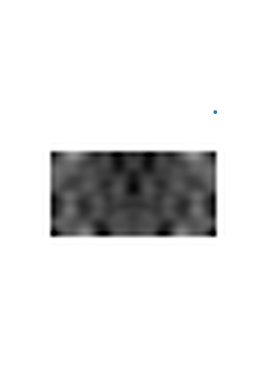

Current iteration: 30
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000176907 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.017601 s
-----------
run 58 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 59 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


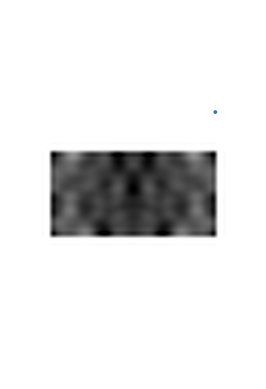

Current iteration: 31
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000184059 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0305359 s
-----------
run 60 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 61 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


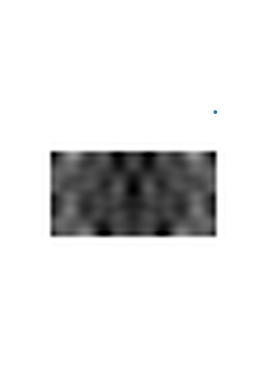

Current iteration: 32
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000189066 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.019681 s
-----------
run 62 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 63 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


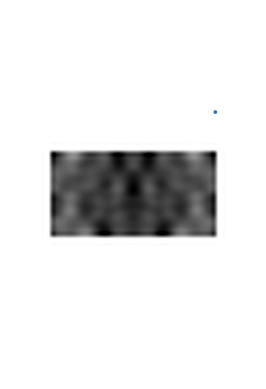

Current iteration: 33
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000184059 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0198472 s
-----------
run 64 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 65 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


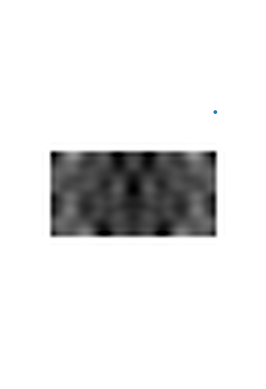

Current iteration: 34
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000182152 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0381279 s
-----------
run 66 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 67 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


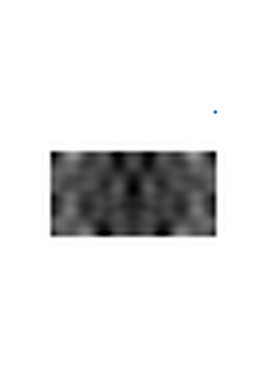

Current iteration: 35
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000188112 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0184152 s
-----------
run 68 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 69 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


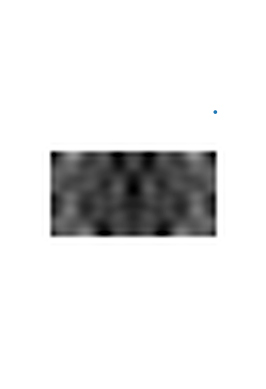

Current iteration: 36
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000195026 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.028779 s
-----------
run 70 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 71 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


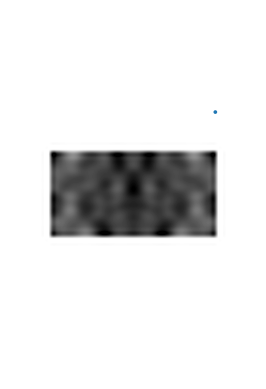

Current iteration: 37
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000183105 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0302529 s
-----------
run 72 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 73 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


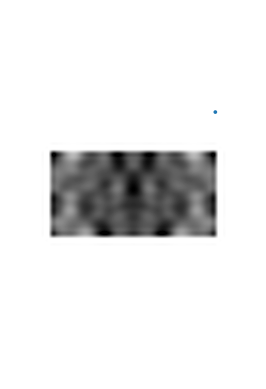

Current iteration: 38
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000192881 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0260608 s
-----------
run 74 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 75 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


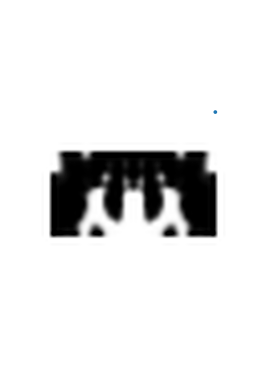

Current iteration: 39
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000179052 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0296052 s
-----------
run 76 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 77 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


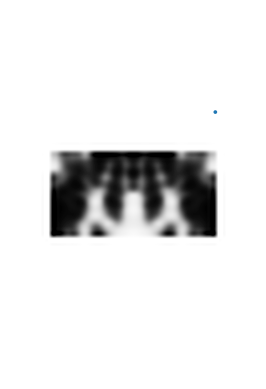

Current iteration: 40
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000211954 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.030201 s
-----------
run 78 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 79 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


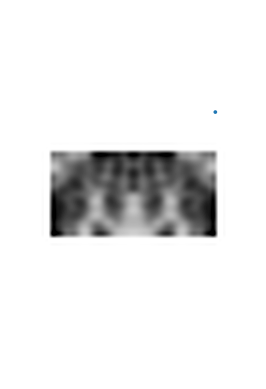

Current iteration: 41
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000202894 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.028306 s
-----------
run 80 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 81 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


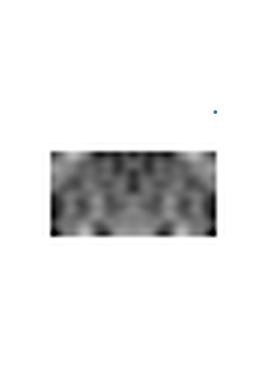

Current iteration: 42
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000194073 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0260911 s
-----------
run 82 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 83 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


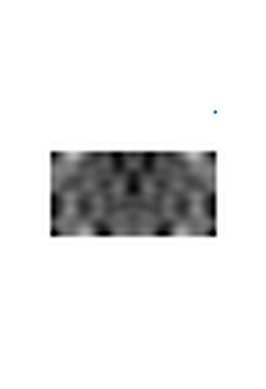

Current iteration: 43
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.00019002 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0190921 s
-----------
run 84 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 85 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


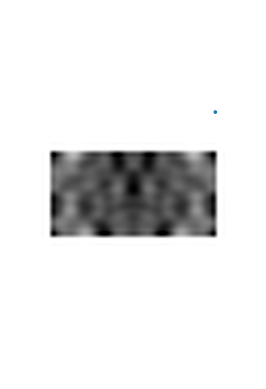

Current iteration: 44
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000216961 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.076122 s
-----------
run 86 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 87 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


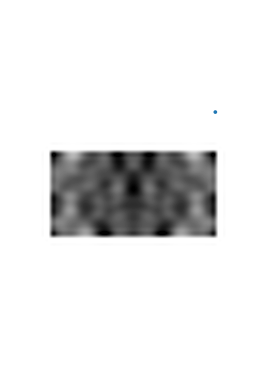

Current iteration: 45
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.00018096 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.018698 s
-----------
run 88 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 89 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


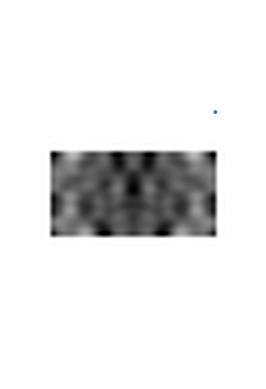

Current iteration: 46
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000201941 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.022181 s
-----------
run 90 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 91 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


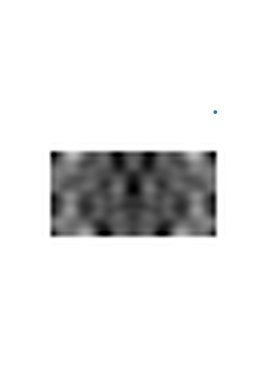

Current iteration: 47
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000206947 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0202231 s
-----------
run 92 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 93 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


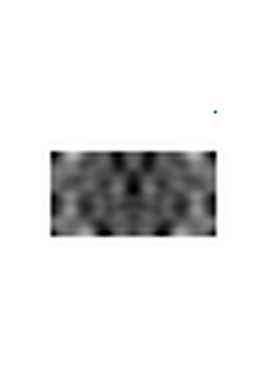

Current iteration: 48
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.00019598 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.019582 s
-----------
run 94 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 95 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


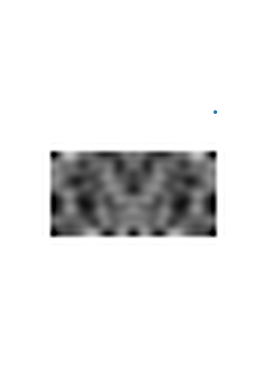

Current iteration: 49
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.00018692 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0290771 s
-----------
run 96 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 97 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


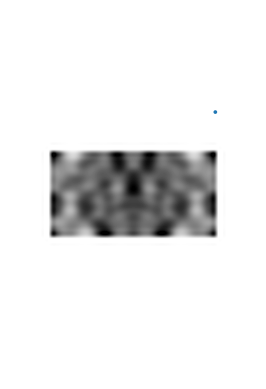

Current iteration: 50
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000200033 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.023385 s
-----------
run 98 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 99 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


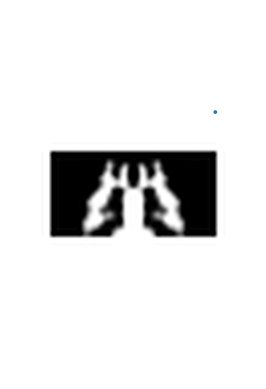

Current iteration: 51
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000200987 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0250721 s
-----------
run 100 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 101 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


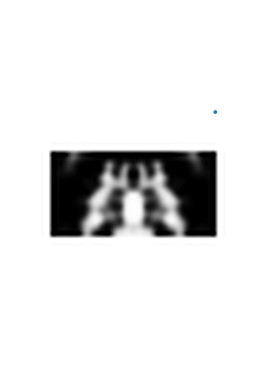

Current iteration: 52
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000181913 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.02635 s
-----------
run 102 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 103 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


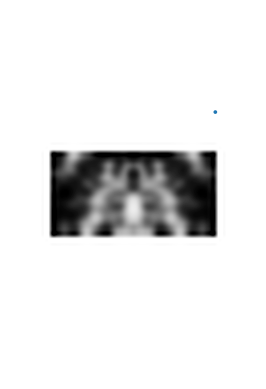

Current iteration: 53
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.00018692 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0269289 s
-----------
run 104 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 105 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


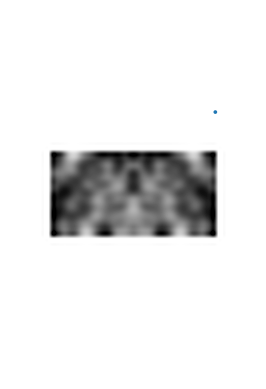

Current iteration: 54
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000200987 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.026263 s
-----------
run 106 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 107 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


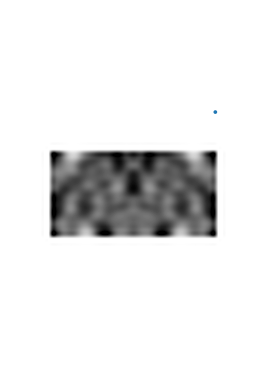

Current iteration: 55
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000184059 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0189619 s
-----------
run 108 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 109 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


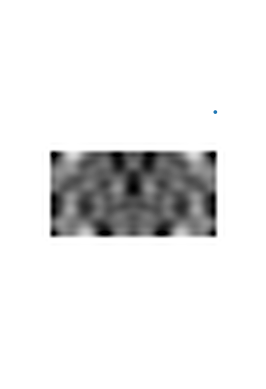

Current iteration: 56
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000194073 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0238779 s
-----------
run 110 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 111 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


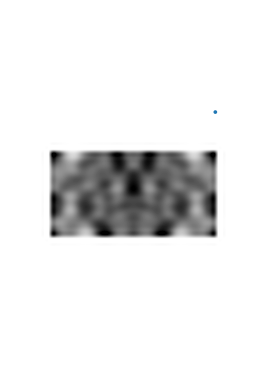

Current iteration: 57
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000185966 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.018086 s
-----------
run 112 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 113 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


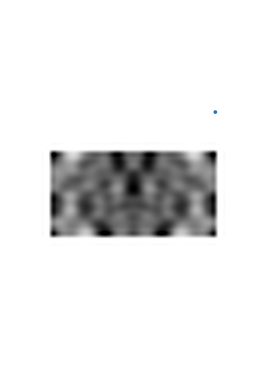

Current iteration: 58
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000181913 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0205588 s
-----------
run 114 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 115 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


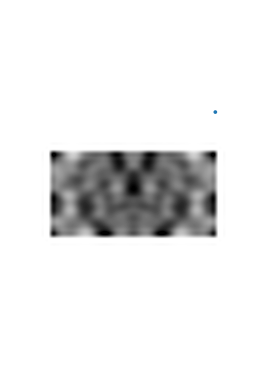

Current iteration: 59
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.00019002 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0178671 s
-----------
run 116 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 117 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


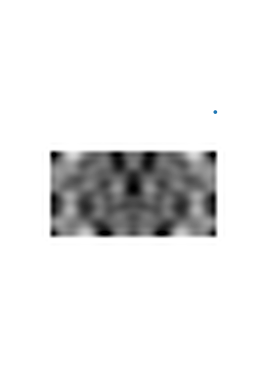

Current iteration: 60
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000194073 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0188229 s
-----------
run 118 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 119 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


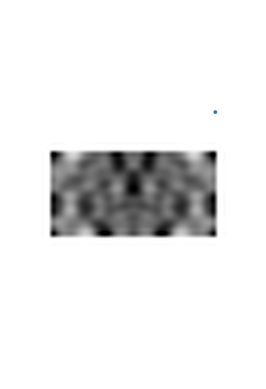

Current iteration: 61
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000187159 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0330951 s
-----------
run 120 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 121 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


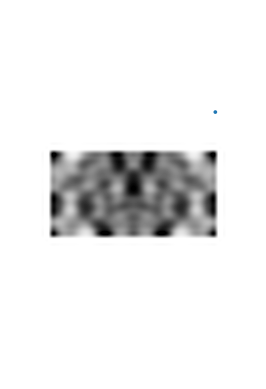

Current iteration: 62
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000211 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.018292 s
-----------
run 122 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 123 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


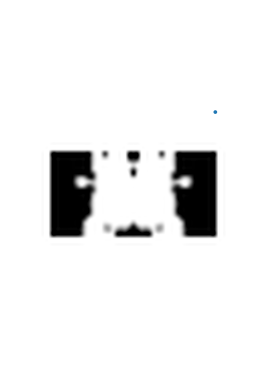

Current iteration: 63
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000185013 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.02614 s
-----------
run 124 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 125 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


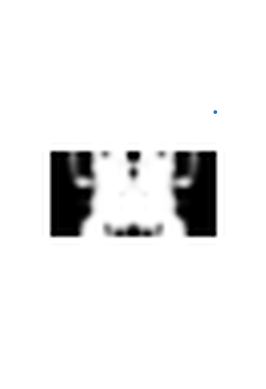

Current iteration: 64
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000211 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0196459 s
-----------
run 126 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 127 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


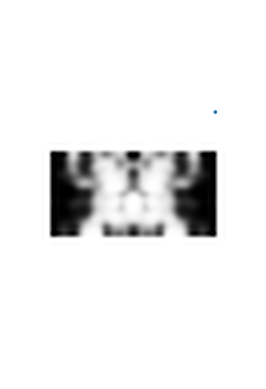

Current iteration: 65
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000181913 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0239241 s
-----------
run 128 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 129 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


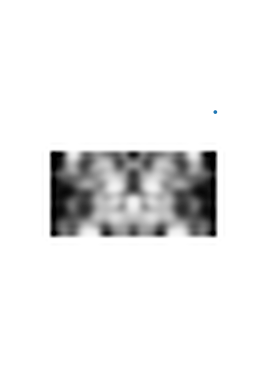

Current iteration: 66
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000187874 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.019927 s
-----------
run 130 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 131 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


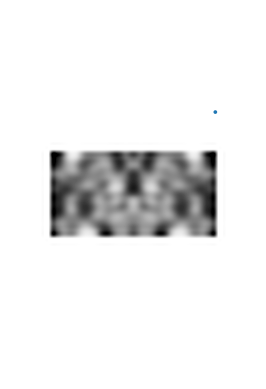

Current iteration: 67
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000203133 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.018779 s
-----------
run 132 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 133 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


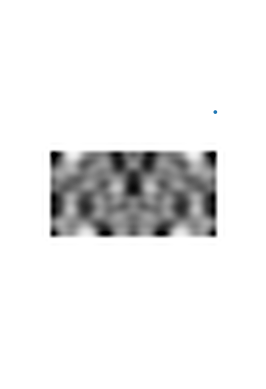

Current iteration: 68
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000190973 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0240829 s
-----------
run 134 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 135 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


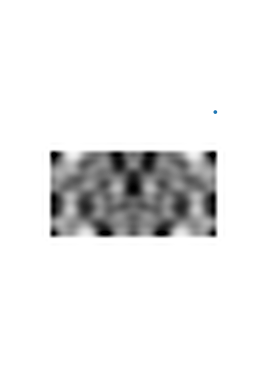

Current iteration: 69
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000181913 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.018415 s
-----------
run 136 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 137 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


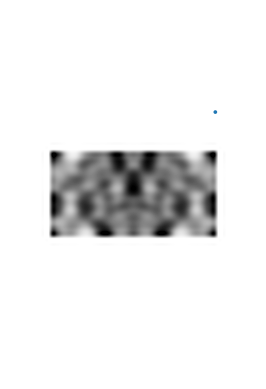

Current iteration: 70
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000184059 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0187838 s
-----------
run 138 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 139 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


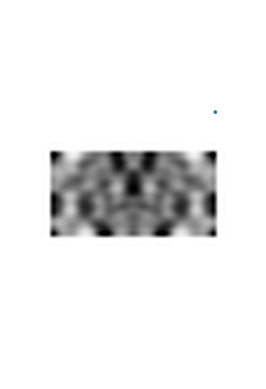

Current iteration: 71
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.00017786 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0193338 s
-----------
run 140 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 141 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


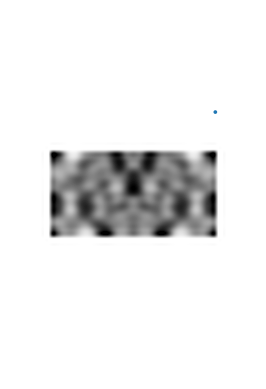

Current iteration: 72
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000198126 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0226331 s
-----------
run 142 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 143 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


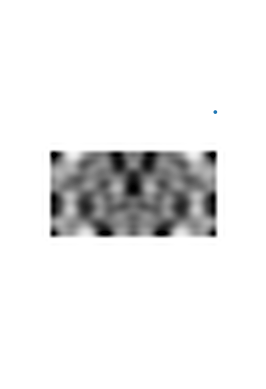

Current iteration: 73
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000177145 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0196009 s
-----------
run 144 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 145 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


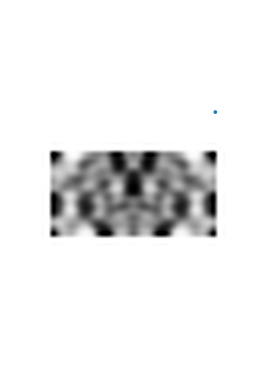

Current iteration: 74
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000185013 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0256338 s
-----------
run 146 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 147 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


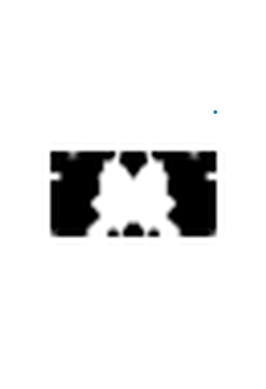

Current iteration: 75
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000188112 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0192602 s
-----------
run 148 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 149 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


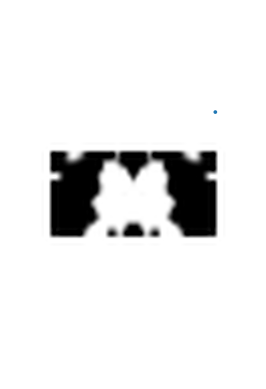

Current iteration: 76
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000193119 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.027436 s
-----------
run 150 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 151 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


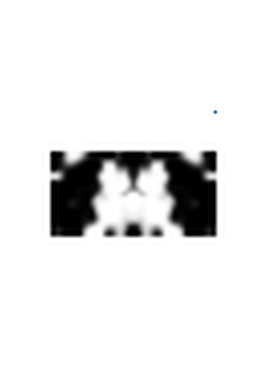

Current iteration: 77
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000191927 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.018609 s
-----------
run 152 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 153 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


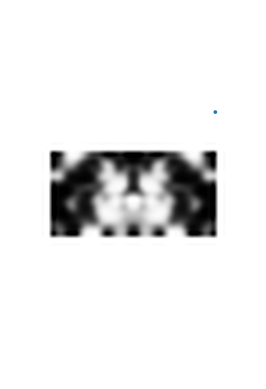

Current iteration: 78
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.00018096 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.034699 s
-----------
run 154 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 155 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


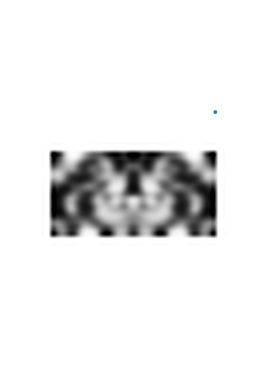

Current iteration: 79
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000174046 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.033066 s
-----------
run 156 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 157 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


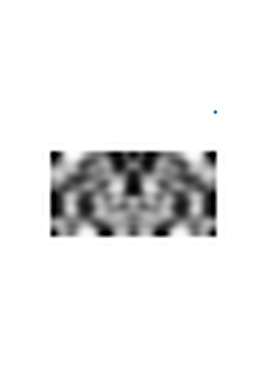

Current iteration: 80
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.00019002 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0277259 s
-----------
run 158 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 159 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


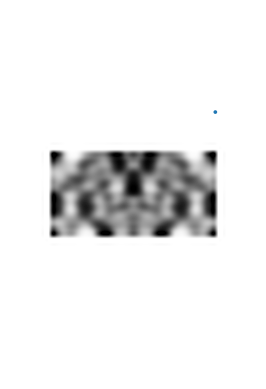

Current iteration: 81
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000183821 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0275981 s
-----------
run 160 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 161 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


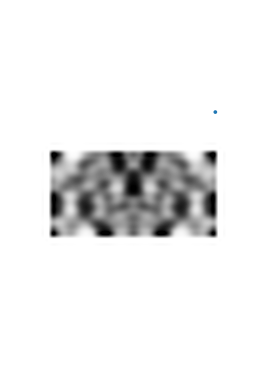

Current iteration: 82
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000181913 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.018672 s
-----------
run 162 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 163 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


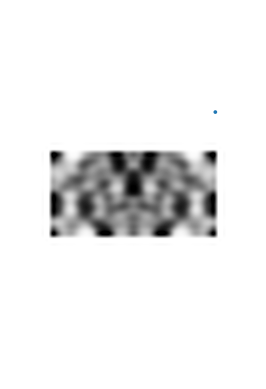

Current iteration: 83
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.00018096 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0491071 s
-----------
run 164 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 165 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


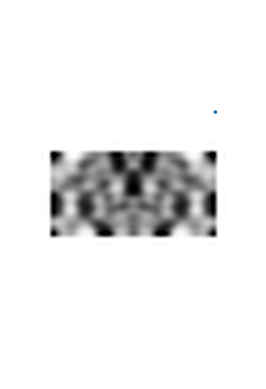

Current iteration: 84
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000193834 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0224431 s
-----------
run 166 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 167 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


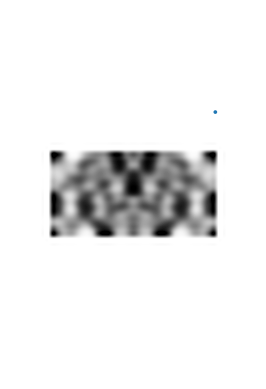

Current iteration: 85
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000208139 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.025269 s
-----------
run 168 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 169 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


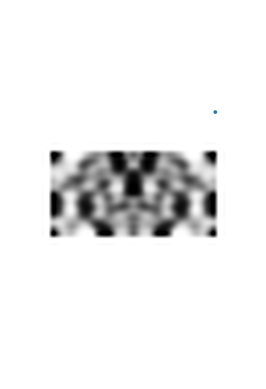

Current iteration: 86
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000175953 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.022486 s
-----------
run 170 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 171 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


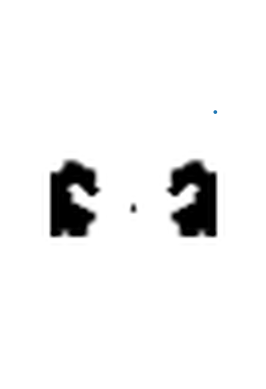

Current iteration: 87
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000209093 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0222259 s
-----------
run 172 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 173 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


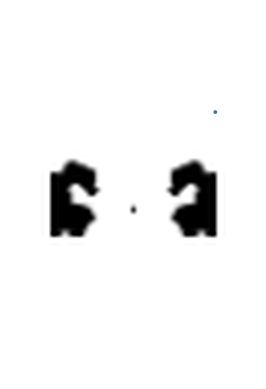

Current iteration: 88
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000192165 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0309179 s
-----------
run 174 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 175 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


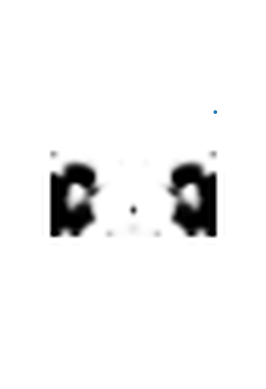

Current iteration: 89
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.00020504 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0204291 s
-----------
run 176 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 177 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


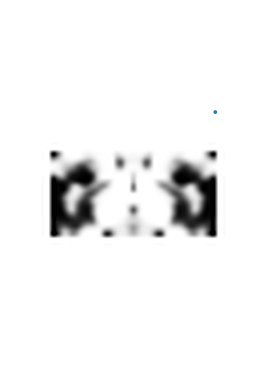

Current iteration: 90
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000211 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0269341 s
-----------
run 178 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 179 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


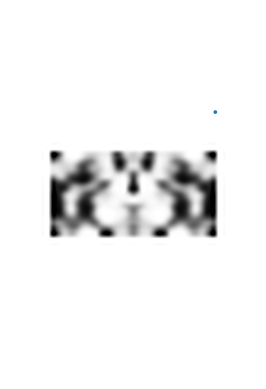

Current iteration: 91
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000187159 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.032387 s
-----------
run 180 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 181 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


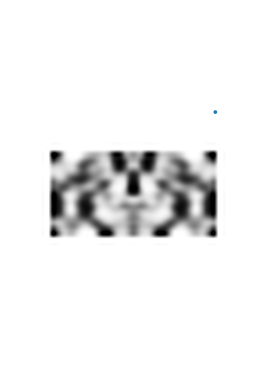

Current iteration: 92
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000188112 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0296121 s
-----------
run 182 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 183 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


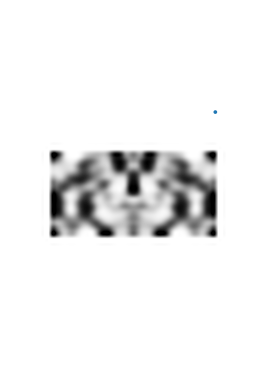

Current iteration: 93
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000208139 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0406129 s
-----------
run 184 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 185 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


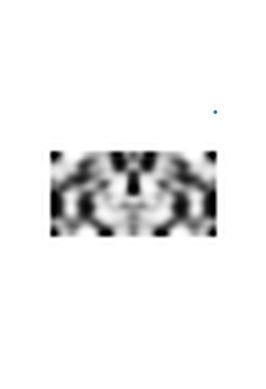

Current iteration: 94
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000190973 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.054847 s
-----------
run 186 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 187 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


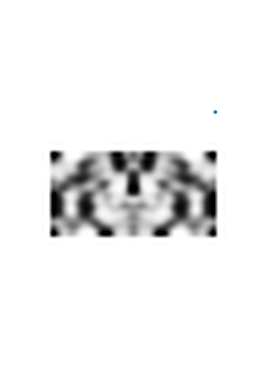

Current iteration: 95
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000217915 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0250618 s
-----------
run 188 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 189 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


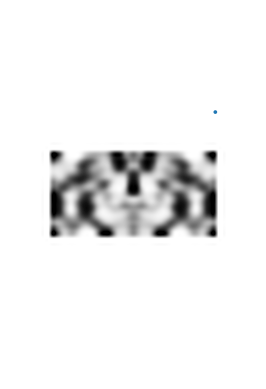

Current iteration: 96
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000184059 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.025583 s
-----------
run 190 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 191 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


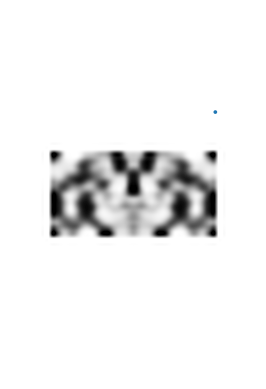

Current iteration: 97
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000188112 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0252459 s
-----------
run 192 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 193 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


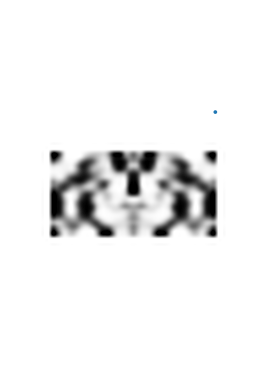

Current iteration: 98
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000208139 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.022531 s
-----------
run 194 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 195 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


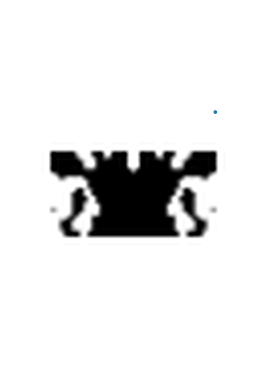

Current iteration: 99
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000194788 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0299759 s
-----------
run 196 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 197 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


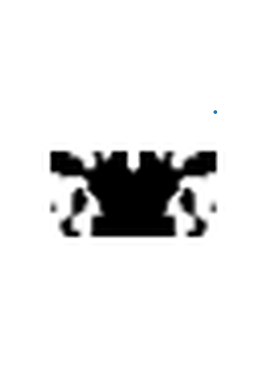

Current iteration: 100
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000177145 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0201261 s
-----------
run 198 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 199 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


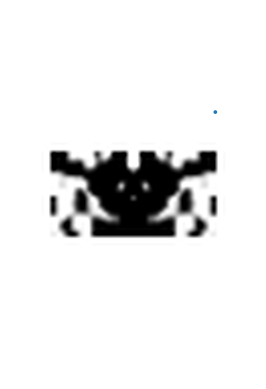

Current iteration: 101
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000187874 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0223191 s
-----------
run 200 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 201 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


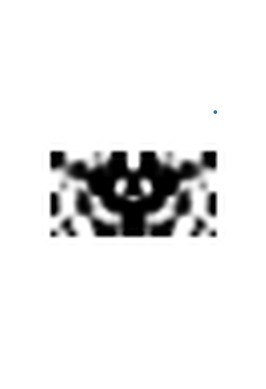

Current iteration: 102
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000183821 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0211921 s
-----------
run 202 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 203 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


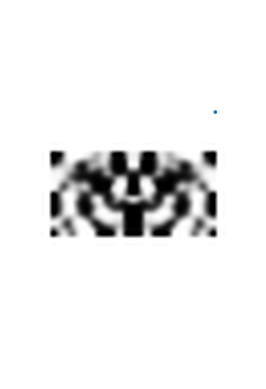

Current iteration: 103
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.0001719 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0231922 s
-----------
run 204 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 205 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


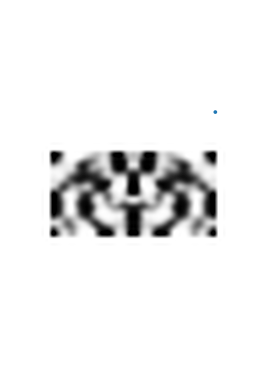

Current iteration: 104
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000201941 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.019882 s
-----------
run 206 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 207 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


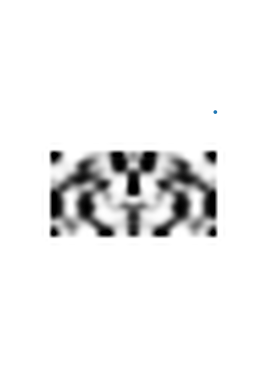

Current iteration: 105
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000205994 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0176339 s
-----------
run 208 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 209 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


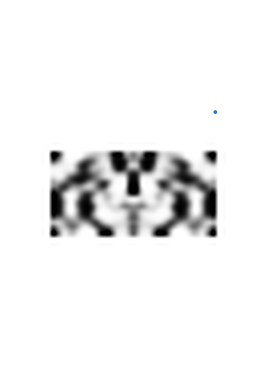

Current iteration: 106
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000209093 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0193319 s
-----------
run 210 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 211 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


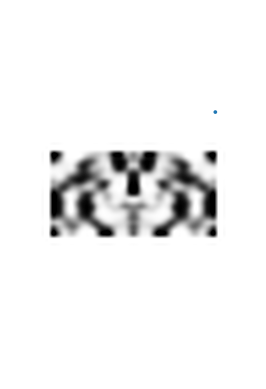

Current iteration: 107
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000191927 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0208929 s
-----------
run 212 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 213 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


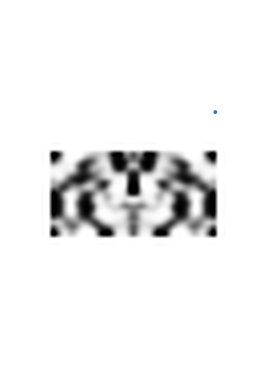

Current iteration: 108
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000962019 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.0295432 s
-----------
run 214 finished at t = 100.05000000000001 (2001 timesteps)
Starting adjoint run...
run 215 finished at t = 100.05000000000001 (2001 timesteps)
Calculating gradient...
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


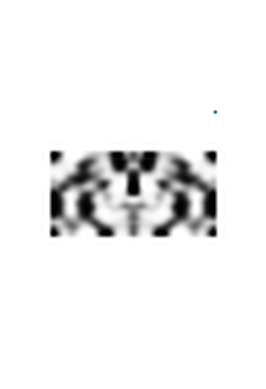

In [ ]:
algorithm = nlopt.LD_MMA
n = Nx * Ny  # number of parameters

# Initial guess
x = np.ones((n,)) * 0.5

# lower and upper bounds
lb = np.zeros((Nx * Ny,))
ub = np.ones((Nx * Ny,))

cur_beta = 4  # 현재 사용하는 beta 값.
beta_scale = 1.5  # beta 값의 스케일링 비율. 여러 beta 값들을 생성할 때, 이 비율로 스케일링할 수 있습니다.
num_betas = 9  # 사용할 beta 값의 개수. beta 값들의 배열을 생성할 때, 몇 개의 beta 값을 사용할지 지정합니다.
update_factor = 12  # 업데이트 계수. 시뮬레이션 중 파라미터를 업데이트할 때 사용하는 계수입니다.
ftol = 1e-5  # 최적화 과정에서 사용하는 함수 값의 허용 오차. 이 값보다 작은 변화가 있을 때, 최적화가 수렴했다고 판단합니다.

for iters in range(num_betas):
    solver = nlopt.opt(algorithm, n)
    solver.set_lower_bounds(lb)
    solver.set_upper_bounds(ub)
    solver.set_max_objective(lambda a, g: f(a, g, cur_beta))
    solver.set_maxeval(update_factor)
    solver.set_ftol_rel(ftol)
    x[:] = solver.optimize(x)
    cur_beta = cur_beta * beta_scale

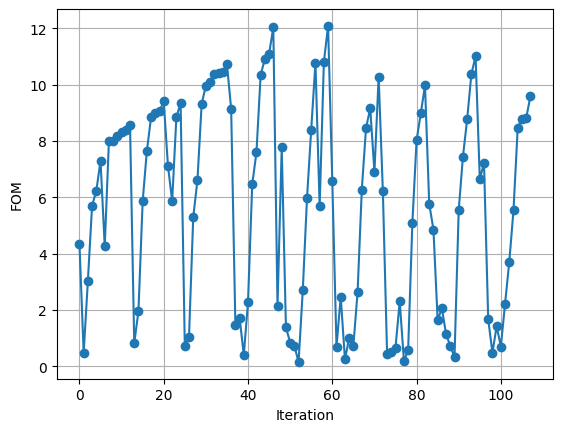

In [ ]:
plt.figure()

plt.plot(evaluation_history, "o-")
plt.grid(True)
plt.xlabel("Iteration")
plt.ylabel("FOM")
plt.show()

     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


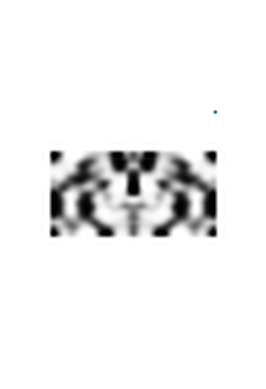

In [ ]:
opt.update_design([mapping(x, eta_i, cur_beta/beta_scale)])
plt.figure()
ax = plt.gca()
opt.plot2D(
    False,
    ax=ax,
    plot_sources_flag=False,
    plot_monitors_flag=False,
    plot_boundaries_flag=False,
)
circ = Circle((2, 2), minimum_length / 2)
ax.add_patch(circ)
ax.axis("off")
plt.show()

-----------
Initializing structure...
time for choose_chunkdivision = 0.000154018 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.015317 s
-----------


FloatProgress(value=0.0, description='0% done ', max=300.0)

run 0 finished at t = 300.0 (6000 timesteps)
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
-----------
Initializing structure...
time for choose_chunkdivision = 0.000174999 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.014879 s
-----------


FloatProgress(value=0.0, description='0% done ', max=300.0)

run 0 finished at t = 300.0 (6000 timesteps)
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
-----------
Initializing structure...
time for choose_chunkdivision = 0.000149965 s
Working in 2D dimensions.
Computational cell is 6 x 9 x 0 with resolution 10
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.018492 s
-----------


FloatProgress(value=0.0, description='0% done ', max=300.0)

run 0 finished at t = 300.0 (6000 timesteps)
     block, center = (0,0,0)
          size (4,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)


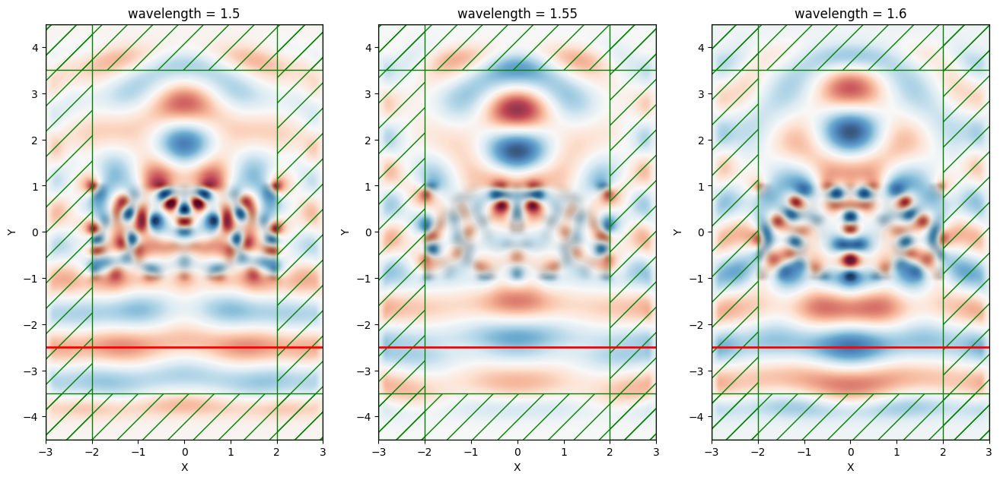

In [ ]:
opt.sim = mp.Simulation(
    cell_size=mp.Vector3(Sx, Sy),
    boundary_layers=pml_layers,
    geometry=geometry,
    sources=source,
    default_material=Air,
    resolution=resolution,
)
src = mp.ContinuousSource(frequency=frequencies[0], fwidth=fwidth, is_integrated=True)
source = [mp.Source(src, component=mp.Ez, size=source_size, center=source_center)]
opt.sim.change_sources(source)

plt.figure(figsize=(16, 10))

plt.subplot(1,3,1)
plt.title('wavelength = '+str(wavelengths[0]))
opt.sim.run(until=300)
opt.sim.plot2D(fields=mp.Ez)
opt.sim.reset_meep()

opt.sim = mp.Simulation(
    cell_size=mp.Vector3(Sx, Sy),
    boundary_layers=pml_layers,
    geometry=geometry,
    sources=source,
    default_material=Air,
    resolution=resolution,
)

src = mp.ContinuousSource(frequency=frequencies[1], fwidth=fwidth, is_integrated=True)
source = [mp.Source(src, component=mp.Ez, size=source_size, center=source_center)]
opt.sim.change_sources(source)

plt.subplot(1,3,2)
plt.title('wavelength = '+str(wavelengths[1]))
opt.sim.run(until=300)
opt.sim.plot2D(fields=mp.Ez)
opt.sim.reset_meep()

opt.sim = mp.Simulation(
    cell_size=mp.Vector3(Sx, Sy),
    boundary_layers=pml_layers,
    geometry=geometry,
    sources=source,
    default_material=Air,
    resolution=resolution,
)

src = mp.ContinuousSource(frequency=frequencies[2], fwidth=fwidth, is_integrated=True)
source = [mp.Source(src, component=mp.Ez, size=source_size, center=source_center)]
opt.sim.change_sources(source)

plt.subplot(1,3,3)
plt.title('wavelength = '+str(wavelengths[2]))
opt.sim.run(until=300)
opt.sim.plot2D(fields=mp.Ez)
opt.sim.reset_meep()

### 3. 전파-인공지능 (Adjoint method) 기반 데이터 증강 기법 실습

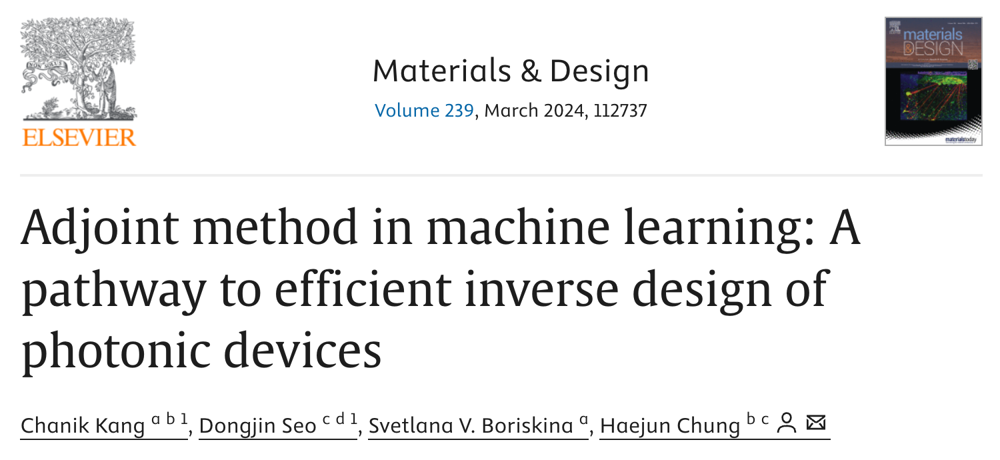

[논문 링크](https://www.sciencedirect.com/science/article/pii/S0264127524001096)

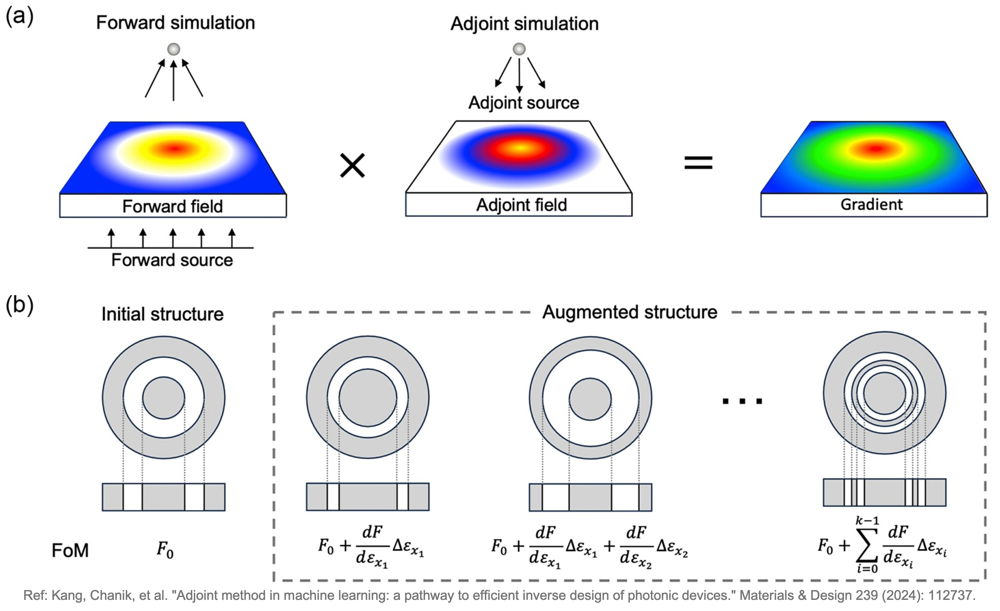

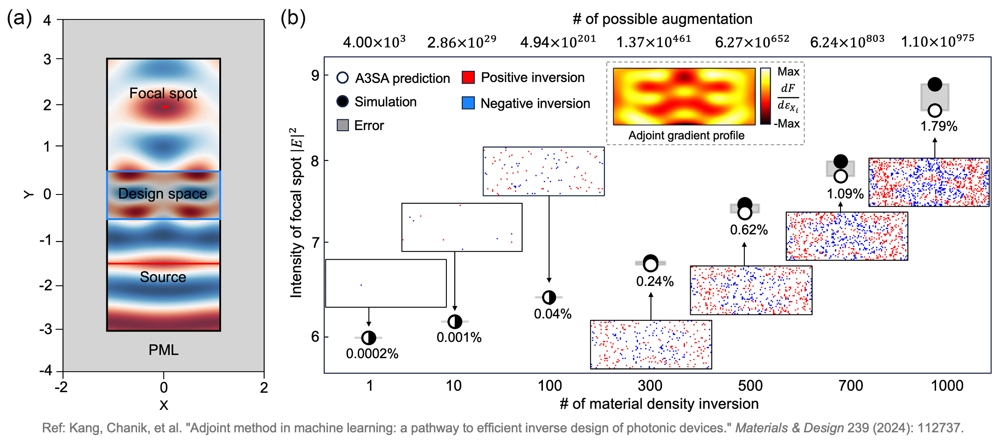

In [ ]:
import meep as mp
import meep.adjoint as mpa
import numpy as np
from autograd import numpy as npa
from matplotlib import pyplot as plt
import random

mp.verbosity(0)
seed = 0
np.random.seed(seed)

# Define the materials
Si = mp.Medium(index=3.4)
SiO2 = mp.Medium(index=2.65)
Air = mp.Medium(index=1.0)

In [ ]:
### Simulation region setup ###
resolution = 40

design_region_width = 2.5
design_region_height = 1
pml_size = 1.0

Sx = 2 * pml_size + design_region_width
Sy = 2 * pml_size + design_region_height + 5
cell_size = mp.Vector3(Sx, Sy)

design_region_resolution = int(resolution)

pml_layers = [mp.PML(pml_size)]

Nx = int(round(design_region_resolution * design_region_width))
Ny = int(round(design_region_resolution * design_region_height))

In [ ]:
### Source setup ###
fcen = 1 / 1.55
width = 0.2
fwidth = width * fcen
source_center = [0, -(design_region_height / 2 + 1.), 0]
source_size = mp.Vector3(Sx, 0, 0)
src = mp.GaussianSource(frequency=fcen, fwidth=fwidth, is_integrated=True)
source = [mp.Source(src, component=mp.Ez, size=source_size, center=source_center)]

### Design region setup ###
design_variables = mp.MaterialGrid(mp.Vector3(Nx, Ny), SiO2, Air, grid_type="U_MEAN")
design_region = mpa.DesignRegion(
    design_variables,
    volume=mp.Volume(
        center=mp.Vector3(),
        size=mp.Vector3(design_region_width, design_region_height, 0),
    ),
)

geometry = [
    mp.Block(
        center=design_region.center, size=design_region.size, material=design_variables
    )
]

sim = mp.Simulation(
    cell_size=cell_size,
    boundary_layers=pml_layers,
    geometry=geometry,
    sources=source,
    eps_averaging=False,
    resolution=resolution,
)

### Monitor setup ###
monitor_position, monitor_size = mp.Vector3(0,design_region_height/2+1.5), mp.Vector3(0.1,0)
FourierFields = mpa.FourierFields(sim,mp.Volume(center=monitor_position,size=monitor_size),mp.Ez,yee_grid=True)
ob_list = [FourierFields]

### Objective function setup ###
def J(fields):
    return npa.mean(npa.abs(fields[:,1]) ** 2)

opt = mpa.OptimizationProblem(
    simulation=sim,
    objective_functions=[J],
    objective_arguments=ob_list,
    design_regions=[design_region],
    fcen=fcen,
    df=0,
    nf=1,
)

In [ ]:
x0 = np.random.rand(Nx * Ny)
x0 = np.full_like(x0, 0.5)

In [ ]:
## save geometry
file_path = 'save_geometry.txt'  # 파일 경로 설정

with open(file_path, 'w') as file:
    for value in x0:
        file.write(f'{value}\n')

In [ ]:
number_of_inversion = int(1)

# 중복되지 않은 랜덤한 숫자 선택 및 idx 배열에 저장
idx = random.sample(range(1, 4001), number_of_inversion) # random index selection

# djdu.txt 파일에서 값을 읽어와 gradient 배열에 저장
gradient = []
with open("gradient.txt", "r") as djdu_file:
    djdu_lines = djdu_file.readlines()
    for i in idx:
        gradient.append(float(djdu_lines[i - 1].strip()))

print('gradient', gradient)
abs_sum_gradient = sum(map(abs, gradient))*0.2


# geometry.txt 파일 열기
with open("save_geometry.txt", "r") as geometry_file:
    geometry_lines = geometry_file.readlines()

# idx 배열과 gradient 배열을 사용하여 geometry 파일 수정
for i in range(len(idx)):
    line_number = idx[i] - 1
    if gradient[i] > 0:
        # 양수인 경우 0.7로 수정
        geometry_lines[line_number] = "0.7\n"
    else:
        # 음수인 경우 0.3으로 수정
        geometry_lines[line_number] = "0.3\n"

# 수정된 내용을 geometry.txt 파일에 쓰기
with open("new_geometry.txt", "w") as geometry_file:
    geometry_file.writelines(geometry_lines)

print("파일 수정이 완료되었습니다.")


gradient [0.012859085631111527]
파일 수정이 완료되었습니다.


In [ ]:
print(abs_sum_gradient)

0.0025718171262223057


In [ ]:
## load geoemtry

file_path = 'new_geometry.txt'

with open(file_path, 'r') as file:
    lines = file.readlines()

values = [float(line.strip()) for line in lines]
x0 = np.array(values)

if x0.size == Nx * Ny:
    print(x0)
else:
    print("x0 배열의 크기가 Nx * Ny와 일치하지 않습니다.")

In [ ]:
opt.update_design([x0])

/usr/local/lib/python3.10/site-packages/meep/visualization.py:533: UserWarning: The frequency parameter of plot2D has been deprecated. Use the frequency key of the eps_parameters dictionary instead.
  warnings.warn(


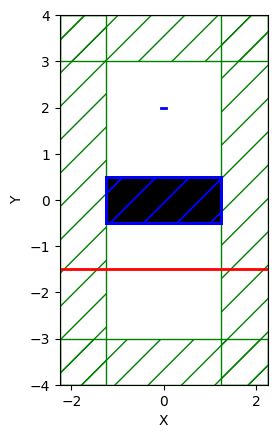

In [ ]:
opt.plot2D(True, frequency=1 / 1.55)
plt.show()

In [ ]:
f0, dJ_du = opt()
print(f0)

Starting forward run...
Starting adjoint run...
Calculating gradient...
5.982362388455709


In [ ]:
print(dJ_du)
file_path = "djdu.txt"

# 배열의 각 값을 .txt 파일에 한 줄씩 저장합니다.
with open(file_path, 'w') as file:
    for value in dJ_du:
        file.write(str(value) + '\n')

print(f"Values saved to {file_path}")

file_path = "gradient.txt"

# 배열의 각 값을 .txt 파일에 한 줄씩 저장합니다.
with open(file_path, 'w') as file:
    for value in dJ_du:
        file.write(str(value) + '\n')

[-0.01375794 -0.00711122 -0.0049882  ...  0.00207562  0.00350628
  0.00778523]
Values saved to djdu.txt


In [ ]:
initial_fom = 5.982362388455709

therical_value =(initial_fom)+(abs_sum_gradient)
print((therical_value))

In [ ]:
error_value = abs(((f0)-(therical_value))/f0)*100

print(error_value)

NameError: name 'therical_value' is not defined

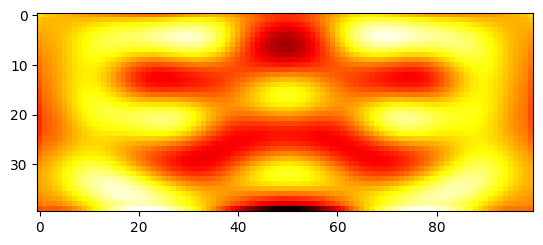

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

plt.imshow(np.rot90(dJ_du.reshape(Nx, Ny)), cmap='hot')

plt.show()

### 요약

1. FDTD simulation - Meep (python)
2. Adjoint simulation
3. Adjoint method based data augmentation